# Your first neural network

In this project, you'll build your first neural network and use it to predict daily bike rental ridership. We've provided some of the code, but left the implementation of the neural network up to you (for the most part). After you've submitted this project, feel free to explore the data and the model more.



In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

## Load and prepare the data

A critical step in working with neural networks is preparing the data correctly. Variables on different scales make it difficult for the network to efficiently learn the correct weights. Below, we've written the code to load and prepare the data. You'll learn more about this soon!

In [2]:
data_path = 'Bike-Sharing-Dataset/hour.csv'

rides = pd.read_csv(data_path)

In [3]:
rides.head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1


## Checking out the data

This dataset has the number of riders for each hour of each day from January 1 2011 to December 31 2012. The number of riders is split between casual and registered, summed up in the `cnt` column. You can see the first few rows of the data above.

Below is a plot showing the number of bike riders over the first 10 days or so in the data set. (Some days don't have exactly 24 entries in the data set, so it's not exactly 10 days.) You can see the hourly rentals here. This data is pretty complicated! The weekends have lower over all ridership and there are spikes when people are biking to and from work during the week. Looking at the data above, we also have information about temperature, humidity, and windspeed, all of these likely affecting the number of riders. You'll be trying to capture all this with your model.

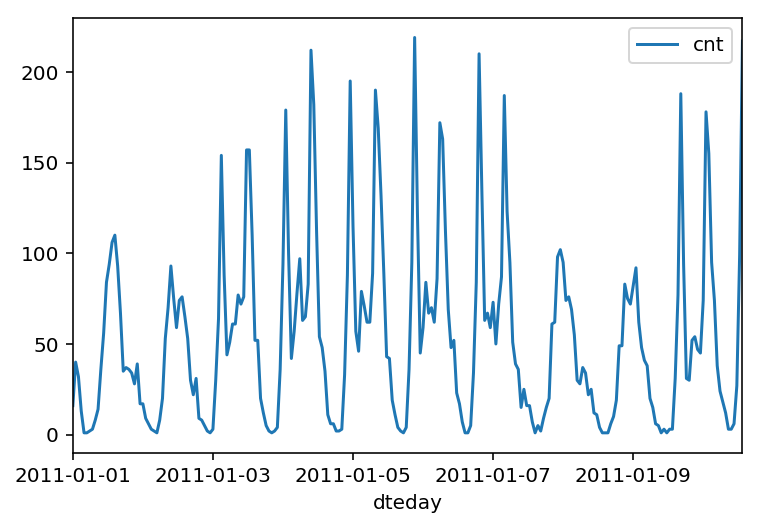

In [4]:
rides[:24*10].plot(x='dteday', y='cnt')

### Dummy variables
Here we have some categorical variables like season, weather, month. To include these in our model, we'll need to make binary dummy variables. This is simple to do with Pandas thanks to `get_dummies()`.

In [5]:
dummy_fields = ['season', 'weathersit', 'mnth', 'hr', 'weekday']
for each in dummy_fields:
    dummies = pd.get_dummies(rides[each], prefix=each, drop_first=False)
    rides = pd.concat([rides, dummies], axis=1)

fields_to_drop = ['instant', 'dteday', 'season', 'weathersit', 
                  'weekday', 'atemp', 'mnth', 'workingday', 'hr']
data = rides.drop(fields_to_drop, axis=1)
data.head()

,yr,holiday,temp,hum,windspeed,casual,registered,cnt,season_1,season_2,...,hr_21,hr_22,hr_23,weekday_0,weekday_1,weekday_2,weekday_3,weekday_4,weekday_5,weekday_6
0,0,0,0.24,0.81,0.0,3,13,16,1,0,...,0,0,0,0,0,0,0,0,0,1
1,0,0,0.22,0.80,0.0,8,32,40,1,0,...,0,0,0,0,0,0,0,0,0,1
2,0,0,0.22,0.80,0.0,5,27,32,1,0,...,0,0,0,0,0,0,0,0,0,1
3,0,0,0.24,0.75,0.0,3,10,13,1,0,...,0,0,0,0,0,0,0,0,0,1
4,0,0,0.24,0.75,0.0,0,1,1,1,0,...,0,0,0,0,0,0,0,0,0,1


### Scaling target variables
To make training the network easier, we'll standardize each of the continuous variables. That is, we'll shift and scale the variables such that they have zero mean and a standard deviation of 1.

The scaling factors are saved so we can go backwards when we use the network for predictions.

In [6]:
quant_features = ['casual', 'registered', 'cnt', 'temp', 'hum', 'windspeed']
# Store scalings in a dictionary so we can convert back later
scaled_features = {}
for each in quant_features:
    mean, std = data[each].mean(), data[each].std()
    scaled_features[each] = [mean, std]
    data.loc[:, each] = (data[each] - mean)/std

### Splitting the data into training, testing, and validation sets

We'll save the data for the last approximately 21 days to use as a test set after we've trained the network. We'll use this set to make predictions and compare them with the actual number of riders.

In [7]:
# Save data for approximately the last 21 days 
test_data = data[-21*24:]

# Now remove the test data from the data set 
data = data[:-21*24]

# Separate the data into features and targets
target_fields = ['cnt', 'casual', 'registered']
features, targets = data.drop(target_fields, axis=1), data[target_fields]
test_features, test_targets = test_data.drop(target_fields, axis=1), test_data[target_fields]
print(targets[:15])

         cnt    casual  registered
0  -0.956312 -0.662736   -0.930162
1  -0.823998 -0.561326   -0.804632
2  -0.868103 -0.622172   -0.837666
3  -0.972851 -0.662736   -0.949983
4  -1.039008 -0.723582   -1.009445
5  -1.039008 -0.723582   -1.009445
6  -1.033495 -0.683018   -1.016052
7  -1.027981 -0.703300   -1.002838
8  -1.000416 -0.703300   -0.969804
9  -0.967338 -0.561326   -0.976411
10 -0.846051 -0.480199   -0.857487
11 -0.735789 -0.196252   -0.817845
12 -0.581424 -0.135406   -0.652673
13 -0.526293  0.229668   -0.705528
14 -0.460137 -0.013715   -0.546963


We'll split the data into two sets, one for training and one for validating as the network is being trained. Since this is time series data, we'll train on historical data, then try to predict on future data (the validation set).

In [8]:
# Hold out the last 60 days or so of the remaining data as a validation set
train_features, train_targets = features[:-60*24], targets[:-60*24]
val_features, val_targets = features[-60*24:], targets[-60*24:]

## Time to build the network

Below you'll build your network. We've built out the structure and the backwards pass. You'll implement the forward pass through the network. You'll also set the hyperparameters: the learning rate, the number of hidden units, and the number of training passes.

<img src="assets/neural_network.png" width=300px>

The network has two layers, a hidden layer and an output layer. The hidden layer will use the sigmoid function for activations. The output layer has only one node and is used for the regression, the output of the node is the same as the input of the node. That is, the activation function is $f(x)=x$. A function that takes the input signal and generates an output signal, but takes into account the threshold, is called an activation function. We work through each layer of our network calculating the outputs for each neuron. All of the outputs from one layer become inputs to the neurons on the next layer. This process is called *forward propagation*.

We use the weights to propagate signals forward from the input to the output layers in a neural network. We use the weights to also propagate error backwards from the output back into the network to update our weights. This is called *backpropagation*.

> **Hint:** You'll need the derivative of the output activation function ($f(x) = x$) for the backpropagation implementation. If you aren't familiar with calculus, this function is equivalent to the equation $y = x$. What is the slope of that equation? That is the derivative of $f(x)$.

Below, you have these tasks:
1. Implement the sigmoid function to use as the activation function. Set `self.activation_function` in `__init__` to your sigmoid function.
2. Implement the forward pass in the `train` method.
3. Implement the backpropagation algorithm in the `train` method, including calculating the output error.
4. Implement the forward pass in the `run` method.
  

In [174]:

class NeuralNetwork(object):
    def __init__(self, input_nodes, hidden_nodes, output_nodes, learning_rate):
        # Set number of nodes in input, hidden and output layers.
        self.input_nodes = input_nodes     #3
        self.hidden_nodes = hidden_nodes   #2
        self.output_nodes = output_nodes   #1

        # Initialize weights
        # w_input_hidden  (3,2)
        self.weights_input_to_hidden = np.random.normal(0.0, self.input_nodes**-0.5, 
                                       (self.input_nodes, self.hidden_nodes))
        # w_hidden_output (2,1)
        self.weights_hidden_to_output = np.random.normal(0.0, self.hidden_nodes**-0.5, 
                                       (self.hidden_nodes,output_nodes))
       
        self.lr = learning_rate  # 0.5
        
        #### TODO: Set self.activation_function to your implemented sigmoid function ####
        self.activation_function = lambda x : (1 / (1 + np.exp(-x)))  # Replace 0 with your sigmoid calculation.
        self.sigmoid_prime = lambda x : x * (1 - x)  # sigmoid_prime
        
    def train(self, features, targets):
        ''' Train the network on batch of features and targets. 
            features: 2D array, each row is one data record, each column is a feature
            targets: 1D array of target values
        '''
        #inputs = np.array([[0.5, -0.2, 0.1]])
        #targets = np.array([[0.4]])
        # features : (1,3), targets : (1,1)
        
        n_records = features.shape[0]
        
        # zero matrix
        # (3,2)
        delta_weights_i_h = np.zeros(self.weights_input_to_hidden.shape)
        # (2,1)
        delta_weights_h_o = np.zeros(self.weights_hidden_to_output.shape)
        
        for X, y in zip(features, targets):
            # features : (1,3), targets : (1,1)
            #  X (3,)   X[:,None]    y (1,)  -vector shape  []
            
            ######## Forward pass ########
            # TODO: Hidden layer - Replace these values with your calculations.
            #  (2,)     [-0.06 -0.18]
            hidden_inputs = np.dot(X, self.weights_input_to_hidden) # signals into hidden layer
             
            #  (2,) [ 0.4850045   0.45512111]
            hidden_outputs = self.activation_function(hidden_inputs) # signals from hidden layer
            

            
            # TODO: Output layer - Replace these values with your calculations.
            final_inputs = np.dot(hidden_outputs, self.weights_hidden_to_output)  # signals into final output layer

            #  (1,) [ 0.09998924]
            final_outputs = final_inputs # signals from final output layer
               
            
            
            #### Implement the backward pass here ####
            ### Backward pass ###

            # TODO: Output error - Replace this value with your calculations.
            
            # (1, )  [ 0.30001076]
            error = y - final_outputs # Output layer error is the difference between desired target and actual output.
           
            
            # (1,)   [ 0.30001076]
            #output_error_term = error * self.sigmoid_prime(final_outputs) 
            output_error_term = error * 1
            
            
            #  self.weights_hidden_to_output
            #  (2, 1)  -  use T to convert row to column  (1,2)
            #  hidden_error
            #  (2,) [ 0.09000323 -0.03000108]
            hidden_error = np.dot(output_error_term , self.weights_hidden_to_output.T)

            # (2,)  [ 0.02248057 -0.00743984]
            hidden_error_term = hidden_error * self.sigmoid_prime(hidden_outputs)
            
            
            # Weight step (hidden to output)
            print(output_error_term) 
            print(hidden_outputs)
            print (X)
            print(hidden_outputs.shape)
            print(hidden_outputs[:None])
            print(hidden_outputs[:None].shape)
            delta_weights_h_o +=  output_error_term * hidden_outputs[:,None]
           
            # Weight step (input to hidden)
            delta_weights_i_h += hidden_error_term * X[:,None]
            

        # TODO: Update the weights - Replace these values with your calculations.
        self.weights_hidden_to_output += self.lr * delta_weights_h_o/n_records # update hidden-to-output weights with gradient descent step
        self.weights_input_to_hidden += self.lr * delta_weights_i_h/n_records # update input-to-hidden weights with gradient descent step
 
    def run(self, features):
        ''' Run a forward pass through the network with input features 
            features: 1D array of feature values
        '''
        
        #### Implement the forward pass here ####
        # TODO: Hidden layer - replace these values with the appropriate calculations.
        hidden_inputs = np.dot(features,self.weights_input_to_hidden ) # signals into hidden layer
        hidden_outputs = self.activation_function(hidden_inputs) # signals from hidden layer
        
        # TODO: Output layer - Replace these values with the appropriate calculations.
        final_inputs = np.dot(hidden_outputs,self.weights_hidden_to_output) # signals into final output layer
        final_outputs = final_inputs # signals from final output layer 
        # (1, 1)  [[0.09998924]]   vector
        
        return final_outputs

In [175]:
def MSE(y, Y):
    return np.mean((y-Y)**2)

## Unit tests

Run these unit tests to check the correctness of your network implementation. This will help you be sure your network was implemented correctly befor you starting trying to train it. These tests must all be successful to pass the project.

In [176]:
import unittest

inputs = np.array([[0.5, -0.2, 0.1]])
targets = np.array([[0.4]])
# test_w_i_h (3,2)
test_w_i_h = np.array([[0.1, -0.2],
                       [0.4, 0.5],
                       [-0.3, 0.2]])

test_w_h_o = np.array([[0.3],
                       [-0.1]])

class TestMethods(unittest.TestCase):
    
    ##########
    # Unit tests for data loading
    ##########
    
    def test_data_path(self):
        # Test that file path to dataset has been unaltered
        self.assertTrue(data_path.lower() == 'bike-sharing-dataset/hour.csv')
        
    def test_data_loaded(self):
        # Test that data frame loaded
        self.assertTrue(isinstance(rides, pd.DataFrame))
    
    ##########
    # Unit tests for network functionality
    ##########

    def test_activation(self):
        network = NeuralNetwork(3, 2, 1, 0.5)
        # Test that the activation function is a sigmoid
        self.assertTrue(np.all(network.activation_function(0.5) == 1/(1+np.exp(-0.5))))

    def test_train(self):
        # Test that weights are updated correctly on training
        network = NeuralNetwork(3, 2, 1, 0.5)
        network.weights_input_to_hidden = test_w_i_h.copy()
        network.weights_hidden_to_output = test_w_h_o.copy()
        
        network.train(inputs, targets)
        self.assertTrue(np.allclose(network.weights_hidden_to_output, 
                                    np.array([[ 0.37275328], 
                                              [-0.03172939]])))
        self.assertTrue(np.allclose(network.weights_input_to_hidden,
                                    np.array([[ 0.10562014, -0.20185996], 
                                              [0.39775194, 0.50074398], 
                                              [-0.29887597, 0.19962801]])))

    def test_run(self):
        # Test correctness of run method
        network = NeuralNetwork(3, 2, 1, 0.5)
        network.weights_input_to_hidden = test_w_i_h.copy()
        network.weights_hidden_to_output = test_w_h_o.copy()

        self.assertTrue(np.allclose(network.run(inputs), 0.09998924))

suite = unittest.TestLoader().loadTestsFromModule(TestMethods())
unittest.TextTestRunner().run(suite)

.....

[ 0.30001076]
[ 0.4850045   0.45512111]
[ 0.5 -0.2  0.1]
(2,)
[ 0.4850045   0.45512111]
(2,)



----------------------------------------------------------------------
Ran 5 tests in 0.010s

OK


<unittest.runner.TextTestResult run=5 errors=0 failures=0>

## Training the network

Here you'll set the hyperparameters for the network. The strategy here is to find hyperparameters such that the error on the training set is low, but you're not overfitting to the data. If you train the network too long or have too many hidden nodes, it can become overly specific to the training set and will fail to generalize to the validation set. That is, the loss on the validation set will start increasing as the training set loss drops.

You'll also be using a method know as Stochastic Gradient Descent (SGD) to train the network. The idea is that for each training pass, you grab a random sample of the data instead of using the whole data set. You use many more training passes than with normal gradient descent, but each pass is much faster. This ends up training the network more efficiently. You'll learn more about SGD later.

### Choose the number of iterations
This is the number of batches of samples from the training data we'll use to train the network. The more iterations you use, the better the model will fit the data. However, if you use too many iterations, then the model with not generalize well to other data, this is called overfitting. You want to find a number here where the network has a low training loss, and the validation loss is at a minimum. As you start overfitting, you'll see the training loss continue to decrease while the validation loss starts to increase.

### Choose the learning rate
This scales the size of weight updates. If this is too big, the weights tend to explode and the network fails to fit the data. A good choice to start at is 0.1. If the network has problems fitting the data, try reducing the learning rate. Note that the lower the learning rate, the smaller the steps are in the weight updates and the longer it takes for the neural network to converge.

### Choose the number of hidden nodes
The more hidden nodes you have, the more accurate predictions the model will make. Try a few different numbers and see how it affects the performance. You can look at the losses dictionary for a metric of the network performance. If the number of hidden units is too low, then the model won't have enough space to learn and if it is too high there are too many options for the direction that the learning can take. The trick here is to find the right balance in number of hidden units you choose.

In [177]:
import sys

### Set the hyperparameters here ###
iterations = 100
learning_rate = 0.1
hidden_nodes = 2
output_nodes = 1

N_i = train_features.shape[1]
network = NeuralNetwork(N_i, hidden_nodes, output_nodes, learning_rate)

losses = {'train':[], 'validation':[]}
for ii in range(iterations):
    # Go through a random batch of 128 records from the training data set
    batch = np.random.choice(train_features.index, size=128)
    X, y = train_features.ix[batch].values, train_targets.ix[batch]['cnt']
                             
    network.train(X, y)
    
    # Printing out the training progress
    train_loss = MSE(network.run(train_features).T, train_targets['cnt'].values)
    val_loss = MSE(network.run(val_features).T, val_targets['cnt'].values)
    sys.stdout.write("\rProgress: {:2.1f}".format(100 * ii/float(iterations)) \
                     + "% ... Training loss: " + str(train_loss)[:5] \
                     + " ... Validation loss: " + str(val_loss)[:5])
    sys.stdout.flush()
    
    losses['train'].append(train_loss)
    losses['validation'].append(val_loss)

[ 0.00413526]
[ 0.48508527  0.53588166]
[ 0.          0.          0.95043892 -0.08930106  0.27629827  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          1.        ]
(2,)
[ 0.48508527  0.53588166]
(2,)
[-0.10658311]
[ 0.43497125  0.5356502 ]
[ 0.          0.          1.05430474  1.10284219  1.86203995  0.          0.
  1.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.

Progress: 0.0% ... Training loss: 0.944 ... Validation loss: 1.445[ 1.12108585]
[ 0.53610266  0.48662013]
[ 0.          0.          0.95043892  0.84368061  1.37405656  0.          0.
  1.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]
(2,)
[ 0.53610266  0.48662013]
(2,)
[ 2.76103758]
[ 0.48629361  0.7459109 ]
[ 1.          0.          2.09296297 -1.33327663 -1.55384381  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0

[-0.88702274]
[ 0.53778601  0.6046309 ]
[ 1.          0.          0.11951233  0.27352514  0.76428167  0.          1.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.        ]
(2,)
[ 0.53778601  0.6046309 ]
(2,)
[-0.12006201]
[ 0.57753114  0.56965866]
[ 0.          0.         -0.60754843  1.25833914  0.76428167  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.

Progress: 1.0% ... Training loss: 0.935 ... Validation loss: 1.434[ 1.12561237]
[ 0.36896433  0.52298261]
[ 1.          0.          0.32724398 -1.69610284  1.86203995  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.36896433  0.52298261]
(2,)
[-0.10709917]
[ 0.46021898  0.49728877]
[ 0.          0.          0.95043892  0.84368061 -1.55384381  0.          0.
  1.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0

(2,)
[-0.71815283]
[ 0.47531338  0.42561447]
[ 1.          0.         -0.29595096 -0.60762422  0.88607317  1.          0.
  0.          0.          1.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  1.          0.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.47531338  0.42561447]
(2,)
[ 0.45908023]
[ 0.4212446   0.46077745]
[ 1.          0.         -1.12687754 -1.79976747  0.27629827  1.          0.
  0.          0.          1.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.       

Progress: 2.0% ... Training loss: 0.930 ... Validation loss: 1.425[-0.18022525]
[ 0.46787323  0.61894793]
[ 0.          0.          0.11951233 -0.40029496 -0.69966852  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          1.          0.          0.          0.          0.        ]
(2,)
[ 0.46787323  0.61894793]
(2,)
[ 3.72260528]
[ 0.47196136  0.57080528]
[ 1.          0.          0.95043892 -0.29663033  0.51988127  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0

  0.          0.          0.          0.          0.          0.          1.        ]
(2,)
[ 0.46510437  0.52789497]
(2,)
[ 1.06101273]
[ 0.4270264   0.65860991]
[ 1.          0.          1.46976803 -1.64427052  0.03189788  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]
(2,)
[ 0.4270264   0.65860991]
(2,)
[-0.78316544]
[ 0.51947497  0.55130359]
[ 0.          0.          0.4311098   0.06619588  0.51988127  0.          0.
  1.          0.          1.          0.          0.        

Progress: 3.0% ... Training loss: 0.924 ... Validation loss: 1.420[ 0.56454982]
[ 0.36630584  0.53890365]
[ 0.          0.         -0.81528007 -1.64427052  1.13047356  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]
(2,)
[ 0.36630584  0.53890365]
(2,)
[-0.25576743]
[ 0.35671069  0.64096375]
[ 1.          0.         -0.29595096 -1.43694126 -0.69966852  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          1.          0

[ 0.52825133  0.5384883 ]
(2,)
[ 2.59581949]
[ 0.53647323  0.62643179]
[ 1.          0.          0.63884145 -1.28144432  1.86203995  1.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.53647323  0.62643179]
(2,)
[-0.72306063]
[ 0.65226499  0.44028539]
[ 0.          0.          0.01564651  1.62116534  1.37405656  0.          0.
  0.          1.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          

Progress: 4.0% ... Training loss: 0.919 ... Validation loss: 1.414[-0.1111935]
[ 0.36885507  0.57882386]
[ 0.          0.          1.46976803 -0.03746875 -0.45608552  0.          0.
  1.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.        ]
(2,)
[ 0.36885507  0.57882386]
(2,)
[-0.27835162]
[ 0.50972674  0.37018973]
[ 0.          0.         -1.75007248 -0.40029496 -1.55384381  1.          0.
  0.          0.          0.          1.          0.          0.          1.
  0.          0.          0.          0.

[ 0.4550083  0.4351429]
[ 0.          0.         -1.02301172 -0.91861811 -1.55384381  1.          0.
  0.          0.          0.          1.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.        ]
(2,)
[ 0.4550083  0.4351429]
(2,)
[-0.20369499]
[ 0.36657868  0.55562339]
[ 0.          0.         -0.29595096 -0.60762422  1.37405656  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.      

[ 0.5279286   0.48837736]
[ 1.          0.         -0.29595096 -1.28144432  0.03189788  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.        ]
(2,)
[ 0.5279286   0.48837736]
(2,)
[ 1.40386569]
[ 0.34313856  0.43597865]
[ 0.          0.          0.53497563 -1.43694126  0.88607317  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.  

Progress: 5.0% ... Training loss: 0.913 ... Validation loss: 1.404[ 1.17038688]
[ 0.42100155  0.43219741]
[ 0.          1.          1.15817056 -1.07411506 -0.69966852  0.          0.
  0.          1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.42100155  0.43219741]
(2,)
[ 0.47656588]
[ 0.51051745  0.58262357]
[ 1.          0.          0.53497563  0.7918483   0.51988127  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          1.          0.          0

[ 0.54647092  0.53973112]
[ 0.          0.         -0.08821931  0.99917756 -0.45608552  0.          0.
  0.          1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.        ]
(2,)
[ 0.54647092  0.53973112]
(2,)
[-0.17708222]
[ 0.48232793  0.54816095]
[ 0.          0.          0.01564651  0.48085441  0.27629827  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.  

[ 2.77428307]
[ 0.54716054  0.58285977]
[ 1.          0.          0.8465731   1.05100987  2.95979824  0.          0.
  1.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.        ]
(2,)
[ 0.54716054  0.58285977]
(2,)
[-0.55807223]
[ 0.57162627  0.55921513]
[ 0.          0.         -0.19208513  1.31017145  1.61845695  1.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.

Progress: 6.0% ... Training loss: 0.907 ... Validation loss: 1.397[-0.36692666]
[ 0.49394234  0.59538173]
[ 0.          0.          0.22337816 -0.34846264  0.88607317  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.        ]
(2,)
[ 0.49394234  0.59538173]
(2,)
[-0.93466391]
[ 0.43629522  0.44567178]
[ 1.          0.         -1.43847501 -0.97045042  1.13047356  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  1.          0.          0.          0

(2,)
[ 0.50102513  0.40318326]
(2,)
[-0.85973274]
[ 0.46317671  0.60876131]
[ 1.          0.          0.32724398  0.53268672 -1.55384381  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.        ]
(2,)
[ 0.46317671  0.60876131]
(2,)
[-0.78429464]
[ 0.40490971  0.45238982]
[ 0.          0.         -1.54234083  0.32535746 -1.55384381  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.     

Progress: 7.0% ... Training loss: 0.904 ... Validation loss: 1.395[ 0.40876081]
[ 0.3667465   0.61482995]
[ 1.          0.          0.01564651 -1.38510895  2.10644035  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.3667465   0.61482995]
(2,)
[ 0.20053636]
[ 0.42528426  0.65876524]
[ 1.          0.          0.32724398 -1.43694126  0.27629827  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          1

(2,)
[ 0.28016826  0.61313304]
(2,)
[-0.59487966]
[ 0.39152097  0.63201402]
[ 1.          0.          0.22337816 -0.34846264  0.27629827  0.          0.
  0.          1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]
(2,)
[ 0.39152097  0.63201402]
(2,)
[ 1.1264527]
[ 0.50996181  0.56667096]
[ 0.          0.         -0.9191459  -1.64427052 -0.45608552  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.      

Progress: 8.0% ... Training loss: 0.901 ... Validation loss: 1.392[ 2.56444273]
[ 0.26171745  0.59082278]
[ 1.          0.          0.8465731  -0.97045042  0.76428167  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.26171745  0.59082278]
(2,)
[-0.06266294]
[ 0.45148577  0.49185576]
[ 1.          0.         -0.60754843 -0.86678579  1.61845695  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  1.          0.          0.          0

[ 0.52045862  0.48052131]
(2,)
[-0.69689998]
[ 0.51390132  0.34343075]
[ 0.          0.         -1.33460919  0.1180282   0.76428167  1.          0.
  0.          0.          0.          1.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  1.          0.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.51390132  0.34343075]
(2,)
[ 1.80798494]
[ 0.31897222  0.61949013]
[ 1.          0.          1.57363386 -0.71128885  0.88607317  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          

[ 0.32010925  0.61817437]
(2,)
[ 0.25094125]
[ 0.43752382  0.43008276]
[ 1.          0.         -0.29595096 -0.45212727  0.88607317  1.          0.
  0.          0.          0.          1.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.43752382  0.43008276]
(2,)
[ 1.60179437]
[ 0.50588954  0.5503169 ]
[ 1.          0.          0.11951233  0.48085441  0.76428167  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          

Progress: 9.0% ... Training loss: 0.895 ... Validation loss: 1.383[-0.5367742]
[ 0.42707867  0.47413165]
[ 1.          0.         -0.29595096  1.62116534  0.76428167  0.          1.
  0.          0.          0.          1.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.42707867  0.47413165]
(2,)
[-0.55069481]
[ 0.5842628   0.34031466]
[ 0.          0.         -1.75007248  0.32535746  1.13047356  1.          0.
  0.          0.          1.          0.          0.          0.          1.
  0.          0.          0.          0.

(2,)
[ 1.85723452]
[ 0.52924422  0.5332093 ]
[ 1.          0.          0.53497563  1.05100987  0.88607317  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.        ]
(2,)
[ 0.52924422  0.5332093 ]
(2,)
[ 0.74708521]
[ 0.39377999  0.73828009]
[ 0.          0.          1.7813655  -1.69610284  0.27629827  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.       

(2,)
[ 0.4346475   0.64918568]
(2,)
[ 0.34410614]
[ 0.46159686  0.44566659]
[ 1.          0.         -1.33460919 -1.12594737  0.88607317  1.          0.
  0.          0.          1.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]
(2,)
[ 0.46159686  0.44566659]
(2,)
[ 0.15435002]
[ 0.43698418  0.6128249 ]
[ 1.          0.          0.4311098  -0.50395959  0.27629827  0.          0.
  0.          1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.     

[ 0.37116151  0.66624028]
[ 1.          0.          1.05430474 -0.24479801  0.27629827  0.          1.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.        ]
(2,)
[ 0.37116151  0.66624028]
(2,)
[-0.81940159]
[ 0.35753334  0.53639524]
[ 1.          0.          0.8465731   0.32535746 -1.55384381  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.  

(2,)
[ 0.59719483  0.42778338]
(2,)
[-0.84387582]
[ 0.50677871  0.42420774]
[ 0.          0.         -1.23074336 -0.34846264 -1.55384381  1.          0.
  0.          0.          1.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.        ]
(2,)
[ 0.50677871  0.42420774]
(2,)
[ 1.22582867]
[ 0.40509514  0.59092326]
[ 1.          0.          1.15817056 -1.9034321   2.47181485  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.     

(2,)
[ 0.4274864   0.62143904]
(2,)
[ 0.56408225]
[ 0.50143937  0.48237443]
[ 1.          0.         -0.81528007 -1.07411506  0.51988127  1.          0.
  0.          0.          0.          1.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.        ]
(2,)
[ 0.50143937  0.48237443]
(2,)
[ 0.18664349]
[ 0.40708811  0.62371361]
[ 0.          0.          0.74270727  0.1180282  -0.21168512  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.     

Progress: 11.0% ... Training loss: 0.887 ... Validation loss: 1.379[-0.6502669]
[ 0.36111238  0.63877758]
[ 1.          0.          0.11951233 -0.19296569 -0.69966852  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.36111238  0.63877758]
(2,)
[-0.792447]
[ 0.46049235  0.63558071]
[ 1.          0.          0.22337816  0.27352514  0.03189788  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0. 

(2,)
[ 0.39619981  0.52088606]
(2,)
[-0.9947733]
[ 0.4470759   0.66590601]
[ 1.          0.          1.05430474  0.58451904 -0.45608552  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.        ]
(2,)
[ 0.4470759   0.66590601]
(2,)
[ 2.5630082]
[ 0.497319   0.6630801]
[ 1.          0.          0.53497563  0.32535746 -0.21168512  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.         

Progress: 12.0% ... Training loss: 0.884 ... Validation loss: 1.381[-0.56694965]
[ 0.50701367  0.3830862 ]
[ 0.          0.         -1.54234083 -1.17777969  0.51988127  1.          0.
  0.          0.          0.          1.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.        ]
(2,)
[ 0.50701367  0.3830862 ]
(2,)
[-0.98986668]
[ 0.44923482  0.6007485 ]
[ 0.          0.         -1.43847501  0.63635135 -0.45608552  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          

[ 0.48767522  0.66669514]
(2,)
[ 2.40087133]
[ 0.35322568  0.63967771]
[ 1.          0.          1.46976803 -1.74793515  1.13047356  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.        ]
(2,)
[ 0.35322568  0.63967771]
(2,)
[-0.29569488]
[ 0.40042307  0.45741523]
[ 0.          0.          0.74270727  0.53268672  0.27629827  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          

(2,)
[-0.83365114]
[ 0.49183071  0.5451492 ]
[ 0.          0.          0.95043892  1.05100987 -0.69966852  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.        ]
(2,)
[ 0.49183071  0.5451492 ]
(2,)
[ 2.32875998]
[ 0.57404463  0.48162164]
[ 1.          0.         -1.02301172  0.63635135 -0.82146002  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.       

[-0.66689917]
[ 0.44690969  0.47250508]
[ 1.          0.         -0.5036826  -0.65945653 -0.21168512  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  1.          0.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.44690969  0.47250508]
(2,)
[-0.05605843]
[ 0.45139215  0.54009019]
[ 0.          0.          0.74270727  0.1180282   1.86203995  0.          0.
  1.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.

(2,)
[ 0.52445864  0.55481425]
(2,)
[-0.70191213]
[ 0.58074526  0.51411198]
[ 0.          0.          0.63884145  1.62116534 -0.21168512  0.          0.
  1.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          1.          0.          0.          0.        ]
(2,)
[ 0.58074526  0.51411198]
(2,)
[ 1.23484075]
[ 0.44822263  0.49177842]
[ 0.          0.         -0.29595096  0.74001598 -1.55384381  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.     

(2,)
[ 0.44429068  0.5491937 ]
(2,)
[-1.04532827]
[ 0.36435895  0.5438687 ]
[ 0.          0.         -1.75007248 -0.19296569 -0.21168512  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.36435895  0.5438687 ]
(2,)
[-0.65514714]
[ 0.50889889  0.52231629]
[ 0.          0.         -1.54234083 -1.74793515 -0.82146002  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.     

Progress: 14.0% ... Training loss: 0.878 ... Validation loss: 1.374[-0.33971444]
[ 0.37968043  0.58389328]
[ 1.          0.          1.05430474 -0.24479801 -0.69966852  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.37968043  0.58389328]
(2,)
[-0.46400038]
[ 0.36074451  0.63884956]
[ 0.          0.          2.30069462 -0.60762422 -0.21168512  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          

[ 2.46019091]
[ 0.44105132  0.64289906]
[ 1.          0.          1.05430474 -0.45212727  2.22823185  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.        ]
(2,)
[ 0.44105132  0.64289906]
(2,)
[-1.04212368]
[ 0.44868067  0.67248131]
[ 1.          0.          1.15817056  0.84368061 -1.55384381  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.

  0.          0.          1.          0.          0.          0.          0.        ]
(2,)
[ 0.54204085  0.51534849]
(2,)
[-0.44160733]
[ 0.5626822   0.56579988]
[ 0.          0.         -0.29595096 -0.45212727  0.76428167  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.        ]
(2,)
[ 0.5626822   0.56579988]
(2,)
[-0.72961672]
[ 0.49135992  0.47955153]
[ 0.          0.         -0.9191459  -0.29663033 -0.69966852  0.          1.
  0.          0.          0.          1.          0.        

(2,)
[ 0.54892683  0.50229484]
(2,)
[-0.45035986]
[ 0.68660186  0.33327376]
[ 0.          0.         -1.75007248  0.89551293  0.03189788  1.          0.
  0.          0.          0.          0.          1.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          1.          0.          0.          0.        ]
(2,)
[ 0.68660186  0.33327376]
(2,)
[-0.32713017]
[ 0.5421415   0.28644813]
[ 0.          0.         -1.95780412 -0.65945653  0.27629827  1.          0.
  0.          0.          1.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.     

[ 0.02420487]
[ 0.4222649   0.65001301]
[ 0.          0.         -0.9191459  -2.00709673  0.27629827  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]
(2,)
[ 0.4222649   0.65001301]
(2,)
[-0.00261175]
[ 0.56400412  0.47779052]
[ 0.          0.          0.8465731   0.7918483   0.03189788  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.

[ 1.          0.          0.01564651  0.74001598 -0.82146002  1.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]
(2,)
[ 0.52714375  0.45586901]
(2,)
[-0.44512392]
[ 0.26156245  0.67601917]
[ 0.          0.          1.7813655  -1.79976747 -1.55384381  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.    

(2,)
[-0.48161876]
[ 0.48546529  0.57991479]
[ 0.          0.         -0.60754843  1.25833914 -0.21168512  0.          1.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]
(2,)
[ 0.48546529  0.57991479]
(2,)
[-0.71375615]
[ 0.58080297  0.41506969]
[ 1.          0.         -1.43847501  0.89551293 -0.45608552  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.       

(2,)
[ 0.44465462  0.60421218]
(2,)
[ 0.02592346]
[ 0.60017155  0.54087814]
[ 0.          0.         -1.54234083 -1.17777969  0.76428167  1.          0.
  0.          0.          1.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.        ]
(2,)
[ 0.60017155  0.54087814]
(2,)
[ 0.90370132]
[ 0.412317    0.62176155]
[ 1.          0.          0.32724398 -0.34846264 -0.69966852  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.     

Progress: 16.0% ... Training loss: 0.872 ... Validation loss: 1.366[ 0.04586473]
[ 0.70006425  0.41499475]
[ 0.          0.         -1.75007248  1.56933303 -1.55384381  1.          0.
  0.          0.          0.          0.          1.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.        ]
(2,)
[ 0.70006425  0.41499475]
(2,)
[-0.41917867]
[ 0.4983335   0.33932777]
[ 0.          0.         -1.54234083 -1.17777969 -0.45608552  1.          0.
  0.          0.          1.          0.          0.          0.          1.
  0.          0.          0.          

(2,)
[-0.15569386]
[ 0.42245877  0.62323212]
[ 1.          0.          0.8465731   1.36200377 -0.21168512  0.          0.
  1.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          1.        ]
(2,)
[ 0.42245877  0.62323212]
(2,)
[ 1.17532018]
[ 0.53952974  0.63478503]
[ 0.          0.          0.32724398  0.7918483   1.37405656  0.          1.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.       

  0.          0.          1.          0.          0.          0.          0.        ]
(2,)
[ 0.53791009  0.65583176]
(2,)
[-0.03739343]
[ 0.55241182  0.5516633 ]
[ 0.          0.          0.63884145  1.62116534 -1.55384381  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          1.          0.        ]
(2,)
[ 0.55241182  0.5516633 ]
(2,)
[-0.28107188]
[ 0.3276497   0.52729482]
[ 1.          0.          0.74270727  0.53268672 -1.55384381  0.          0.
  1.          0.          0.          0.          1.        

Progress: 17.0% ... Training loss: 0.868 ... Validation loss: 1.359[ 0.0689868]
[ 0.55733646  0.53057911]
[ 0.          0.         -1.02301172 -0.5557919  -0.82146002  1.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.        ]
(2,)
[ 0.55733646  0.53057911]
(2,)
[ 0.01184586]
[ 0.49164636  0.57855841]
[ 1.          0.          0.11951233  1.62116534  0.27629827  0.          1.
  0.          0.          0.          0.          1.          0.          0.
  0.          1.          0.          0

[ 0.34360797  0.62344489]
[ 1.          0.          1.36590221 -0.03746875 -0.21168512  0.          0.
  1.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.        ]
(2,)
[ 0.34360797  0.62344489]
(2,)
[-0.82039925]
[ 0.56428075  0.43536706]
[ 0.          0.         -1.75007248 -0.40029496  0.03189788  1.          0.
  0.          0.          0.          1.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.  

  0.          1.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.65231958  0.33230265]
(2,)
[ 1.80773029]
[ 0.6558065   0.64924235]
[ 0.          0.          0.11951233  1.31017145 -0.21168512  0.          1.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.        ]
(2,)
[ 0.6558065   0.64924235]
(2,)
[-0.11077136]
[ 0.39575159  0.61032446]
[ 0.          0.          0.01564651 -1.38510895  0.03189788  0.          1.
  0.          0.          1.          0.          0.        

  0.          0.          0.          0.          0.          0.          1.        ]
(2,)
[ 0.47255548  0.5287004 ]
(2,)
[-0.86517431]
[ 0.44690753  0.46247875]
[ 0.          0.         -1.33460919 -1.12594737  2.95979824  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.44690753  0.46247875]
(2,)
[-0.89525922]
[ 0.50941272  0.53234337]
[ 0.          0.         -0.5036826   0.99917756  1.13047356  0.          1.
  0.          0.          0.          0.          1.        

Progress: 18.0% ... Training loss: 0.862 ... Validation loss: 1.347[ 0.99883181]
[ 0.32941812  0.51293221]
[ 1.          0.          1.36590221  0.16986051 -0.45608552  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.32941812  0.51293221]
(2,)
[-0.39820578]
[ 0.52643464  0.51111534]
[ 0.          0.         -1.8539383  -1.64427052 -0.82146002  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  1.          0.          0.          

(2,)
[ 0.36404217  0.61639782]
(2,)
[ 0.00962777]
[ 0.38123472  0.63896952]
[ 0.          0.          1.46976803 -0.19296569  0.03189788  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.        ]
(2,)
[ 0.38123472  0.63896952]
(2,)
[-0.48088294]
[ 0.44581647  0.37575529]
[ 0.          0.         -0.19208513  1.31017145 -1.55384381  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.     

[ 0.39071493  0.51612757]
(2,)
[ 0.12258096]
[ 0.31119333  0.42482644]
[ 0.          0.         -0.5036826  -1.02228274  1.86203995  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.31119333  0.42482644]
(2,)
[ 0.87889501]
[ 0.36493314  0.66091571]
[ 1.          0.          1.15817056 -0.76312116  0.27629827  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          

Progress: 19.0% ... Training loss: 0.860 ... Validation loss: 1.348[ 0.18792995]
[ 0.41324064  0.52072803]
[ 0.          0.         -1.12687754 -0.91861811  0.27629827  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]
(2,)
[ 0.41324064  0.52072803]
(2,)
[-0.51252379]
[ 0.39655502  0.49156985]
[ 1.          0.          0.22337816  0.27352514 -0.69966852  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          

[ 0.44841499  0.5164364 ]
(2,)
[-0.89415899]
[ 0.49658686  0.4531953 ]
[ 1.          0.         -1.8539383  -0.86678579  0.03189788  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.49658686  0.4531953 ]
(2,)
[-0.15979817]
[ 0.50733217  0.40093818]
[ 0.          0.         -0.9191459  -1.38510895  0.03189788  1.          0.
  0.          0.          0.          1.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          

[ 0.51297447  0.53162476]
(2,)
[-0.6623408]
[ 0.65504998  0.37518163]
[ 0.          1.         -1.54234083  0.63635135  1.86203995  1.          0.
  0.          0.          0.          0.          1.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          1.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.65504998  0.37518163]
(2,)
[-0.95240877]
[ 0.43390099  0.54612445]
[ 0.          0.         -0.19208513 -0.19296569 -0.82146002  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0

Progress: 20.0% ... Training loss: 0.859 ... Validation loss: 1.353[ 0.45042763]
[ 0.43393316  0.48957061]
[ 0.          0.          0.01564651 -1.229612   -0.21168512  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.        ]
(2,)
[ 0.43393316  0.48957061]
(2,)
[-0.90819426]
[ 0.4778202   0.51025729]
[ 1.          0.         -0.39981678 -0.45212727 -0.45608552  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  1.          0.          0.          

[ 1.          0.         -0.08821931 -0.40029496  1.37405656  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.36117398  0.5603471 ]
(2,)
[-0.57987911]
[ 0.4176033   0.45893291]
[ 0.          0.         -0.19208513 -0.40029496  0.51988127  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          1.    

[ 0.52127103  0.49148654]
(2,)
[-0.89600949]
[ 0.43408009  0.6791899 ]
[ 1.          0.          0.63884145 -0.29663033 -1.55384381  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]
(2,)
[ 0.43408009  0.6791899 ]
(2,)
[-1.12297011]
[ 0.39007059  0.66327573]
[ 1.          0.          0.74270727  0.1180282   0.27629827  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          

[ 0.45694569  0.46575598]
[ 0.          0.          0.32724398 -0.14113338  0.27629827  0.          1.
  0.          0.          0.          1.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.45694569  0.46575598]
(2,)
[-0.61215589]
[ 0.38961161  0.57577146]
[ 0.          0.          0.11951233  0.01436357 -0.45608552  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.  

[ 0.44216956  0.52988581]
[ 1.          1.          0.63884145  0.7918483  -0.69966852  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.44216956  0.52988581]
(2,)
[-0.82652945]
[ 0.45091389  0.49259686]
[ 0.          0.          0.74270727  1.62116534  0.51988127  0.          0.
  1.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.  

[-0.83985568]
[ 0.60445443  0.55991754]
[ 0.          0.         -0.29595096  1.93215924 -0.82146002  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.        ]
(2,)
[ 0.60445443  0.55991754]
(2,)
[-0.12414864]
[ 0.46881189  0.67602896]
[ 1.          0.          0.63884145  0.53268672 -0.82146002  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.

Progress: 21.0% ... Training loss: 0.857 ... Validation loss: 1.355[-0.70576111]
[ 0.58736859  0.43561125]
[ 1.          0.         -1.43847501 -0.14113338 -0.69966852  1.          0.
  0.          0.          1.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.        ]
(2,)
[ 0.58736859  0.43561125]
(2,)
[ 0.85851737]
[ 0.47262311  0.57117901]
[ 1.          0.         -0.60754843 -1.02228274  0.27629827  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  1.          0.          0.          

(2,)
[ 0.47297799  0.54772614]
(2,)
[-0.62018718]
[ 0.71487526  0.40491457]
[ 0.          0.         -1.54234083  1.93215924 -0.82146002  1.          0.
  0.          0.          0.          0.          1.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]
(2,)
[ 0.71487526  0.40491457]
(2,)
[ 0.14695983]
[ 0.50147396  0.61019045]
[ 1.          0.         -0.5036826  -0.03746875 -0.21168512  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.     

Progress: 22.0% ... Training loss: 0.853 ... Validation loss: 1.348[-0.93305942]
[ 0.44588446  0.43866391]
[ 1.          0.         -1.43847501 -0.97045042  1.13047356  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.44588446  0.43866391]
(2,)
[-0.09038685]
[ 0.62257792  0.37294898]
[ 1.          0.         -1.54234083  0.89551293  0.88607317  1.          0.
  0.          0.          0.          1.          0.          0.          1.
  0.          0.          0.          

Progress: 23.0% ... Training loss: 0.851 ... Validation loss: 1.350[-0.00378008]
[ 0.51320386  0.44812953]
[ 0.          0.         -0.08821931 -0.60762422  2.10644035  0.          0.
  0.          1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.        ]
(2,)
[ 0.51320386  0.44812953]
(2,)
[ 0.55706739]
[ 0.46943055  0.52193694]
[ 0.          0.         -0.19208513 -0.19296569 -1.55384381  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          

[ 1.2274401]
[ 0.37157246  0.59799142]
[ 0.          0.          1.36590221 -0.24479801  2.71621524  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.        ]
(2,)
[ 0.37157246  0.59799142]
(2,)
[-0.56668618]
[ 0.52614676  0.51481878]
[ 0.          0.         -0.9191459   0.94734524  0.51988127  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0. 

Progress: 24.0% ... Training loss: 0.845 ... Validation loss: 1.335[-0.49184837]
[ 0.59383982  0.39480712]
[ 0.          0.         -0.19208513  1.93215924 -1.55384381  0.          0.
  0.          1.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.        ]
(2,)
[ 0.59383982  0.39480712]
(2,)
[-0.92955745]
[ 0.26904841  0.58137752]
[ 1.          0.          0.01564651 -1.229612    0.51988127  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          1.          

[ 0.31063817  0.80261356]
[ 0.          0.          2.30069462 -1.28144432 -0.45608552  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]
(2,)
[ 0.31063817  0.80261356]
(2,)
[-0.22220026]
[ 0.48427689  0.33422552]
[ 0.          0.         -1.23074336 -1.28144432  0.51988127  1.          0.
  0.          0.          1.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.  

Progress: 25.0% ... Training loss: 0.842 ... Validation loss: 1.329[-0.16228386]
[ 0.35697261  0.67655491]
[ 1.          0.          1.15817056  0.16986051 -0.82146002  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          1.          0.          0.          0.          0.        ]
(2,)
[ 0.35697261  0.67655491]
(2,)
[ 2.79673683]
[ 0.36644297  0.56603459]
[ 1.          0.          0.74270727 -0.29663033  2.71621524  0.          0.
  0.          1.          0.          1.          0.          0.          0.
  0.          0.          0.          

(2,)
[ 0.14125534]
[ 0.26479608  0.64531404]
[ 0.          0.          1.36590221 -1.43694126  1.37405656  0.          1.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.        ]
(2,)
[ 0.26479608  0.64531404]
(2,)
[-0.76474426]
[ 0.57377873  0.41531745]
[ 0.          0.         -0.19208513  1.62116534 -1.55384381  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.       

[ 0.2759756   0.64098283]
[ 1.          0.          0.63884145 -0.29663033 -1.55384381  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.2759756   0.64098283]
(2,)
[-0.31961033]
[ 0.51919346  0.50410936]
[ 1.          0.         -0.71141425  0.68818367  0.76428167  0.          1.
  0.          0.          0.          1.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.  

(2,)
[ 0.53230536  0.48431889]
(2,)
[-0.75014463]
[ 0.51267087  0.55110603]
[ 1.          0.          0.22337816  1.05100987 -1.55384381  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.        ]
(2,)
[ 0.51267087  0.55110603]
(2,)
[-0.82833705]
[ 0.35663245  0.58123356]
[ 0.          0.          0.95043892  0.1180282  -0.45608552  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.     

Progress: 26.0% ... Training loss: 0.838 ... Validation loss: 1.323[-0.70354043]
[ 0.71965343  0.43327224]
[ 0.          0.         -1.33460919  1.56933303  0.27629827  0.          1.
  0.          0.          0.          0.          1.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.        ]
(2,)
[ 0.71965343  0.43327224]
(2,)
[ 0.26679568]
[ 0.40504575  0.57056557]
[ 1.          0.         -0.19208513 -1.28144432  0.88607317  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  1.          0.          0.          

(2,)
[-0.54868382]
[ 0.6335158   0.38624967]
[ 0.          0.         -1.12687754  0.94734524 -0.82146002  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          1.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.6335158   0.38624967]
(2,)
[-0.79199926]
[ 0.32541149  0.5713196 ]
[ 1.          0.         -0.71141425 -0.65945653  0.88607317  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.       

Progress: 27.0% ... Training loss: 0.834 ... Validation loss: 1.316[ 0.37863001]
[ 0.48071881  0.35669003]
[ 0.          0.         -0.9191459  -0.50395959  0.51988127  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]
(2,)
[ 0.48071881  0.35669003]
(2,)
[-0.18357973]
[ 0.5184187   0.39545943]
[ 1.          0.         -1.54234083 -1.17777969  1.86203995  1.          0.
  0.          0.          1.          0.          0.          0.          1.
  0.          0.          0.          

[ 1.          0.         -0.81528007 -0.71128885 -0.21168512  1.          0.
  0.          0.          1.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.43476709  0.34487875]
(2,)
[-0.28011383]
[ 0.63810494  0.45586055]
[ 1.          0.         -1.33460919  1.25833914 -0.82146002  1.          0.
  0.          0.          0.          1.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.    

[ 0.27847817  0.69955998]
(2,)
[-0.9978683]
[ 0.28845057  0.57304022]
[ 0.          0.          1.26203639 -0.60762422  0.27629827  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.        ]
(2,)
[ 0.28845057  0.57304022]
(2,)
[-0.83526488]
[ 0.54974076  0.51932938]
[ 0.          0.         -0.19208513  1.31017145  0.27629827  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0

(2,)
[ 0.09984127]
[ 0.5611854   0.54397415]
[ 0.          0.          0.32724398  0.7918483  -0.21168512  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.        ]
(2,)
[ 0.5611854   0.54397415]
(2,)
[-0.97337298]
[ 0.34159697  0.50604083]
[ 0.          0.          0.53497563 -0.14113338 -0.69966852  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.       

Progress: 28.0% ... Training loss: 0.831 ... Validation loss: 1.311[-0.79505733]
[ 0.62970499  0.49003363]
[ 0.          0.         -0.19208513  0.22169283  0.51988127  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.        ]
(2,)
[ 0.62970499  0.49003363]
(2,)
[-0.69641188]
[ 0.64943441  0.45475974]
[ 1.          0.         -1.54234083  0.63635135  0.76428167  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  1.          0.          0.          

[ 1.          0.          1.05430474 -1.07411506  0.03189788  0.          1.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]
(2,)
[ 0.28992813  0.7553682 ]
(2,)
[-0.88775322]
[ 0.51494065  0.52887447]
[ 0.          0.         -1.43847501 -0.81495348  0.27629827  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          1.    

[ 0.33083416  0.73370622]
(2,)
[-0.90918972]
[ 0.41498568  0.52617726]
[ 1.          0.         -1.12687754 -0.34846264  0.03189788  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.        ]
(2,)
[ 0.41498568  0.52617726]
(2,)
[-0.68713022]
[ 0.62543655  0.31487455]
[ 0.          0.         -1.75007248  0.32535746 -0.21168512  1.          0.
  0.          0.          0.          1.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          

Progress: 29.0% ... Training loss: 0.829 ... Validation loss: 1.312[-0.04266702]
[ 0.46557139  0.50058856]
[ 1.          0.         -1.02301172 -0.5557919   0.27629827  1.          0.
  0.          0.          0.          1.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.        ]
(2,)
[ 0.46557139  0.50058856]
(2,)
[ 1.48319445]
[ 0.20834929  0.6975387 ]
[ 1.          0.          0.22337816 -2.31809062  0.88607317  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          1.          

[ 0.39741686  0.53240872]
(2,)
[ 0.98631839]
[ 0.36407653  0.67196859]
[ 1.          0.          1.36590221 -0.40029496  0.03189788  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          1.          0.          0.        ]
(2,)
[ 0.36407653  0.67196859]
(2,)
[ 0.64649011]
[ 0.39105256  0.52924107]
[ 0.          0.          1.05430474  0.1180282  -0.21168512  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          

[-0.3490881]
[ 0.43700199  0.4471516 ]
[ 0.          0.          0.01564651 -0.40029496  0.51988127  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.43700199  0.4471516 ]
(2,)
[-0.77039786]
[ 0.56413824  0.40361734]
[ 0.          0.         -1.43847501 -0.40029496 -0.82146002  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0. 

Progress: 30.0% ... Training loss: 0.826 ... Validation loss: 1.306[ 0.53254732]
[ 0.38805641  0.56294111]
[ 1.          0.          0.11951233 -1.74793515  2.22823185  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.        ]
(2,)
[ 0.38805641  0.56294111]
(2,)
[-0.48384093]
[ 0.5861143   0.47162606]
[ 0.          0.          0.22337816  1.62116534  0.27629827  0.          0.
  1.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          

(2,)
[ 0.07807536]
[ 0.21618508  0.70709665]
[ 0.          0.          1.57363386 -1.9034321  -1.55384381  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.        ]
(2,)
[ 0.21618508  0.70709665]
(2,)
[-0.58732445]
[ 0.47200876  0.56194344]
[ 0.          0.          0.11951233 -0.19296569 -0.45608552  0.          1.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.       

[ 0.47177962  0.70148912]
(2,)
[-0.75234512]
[ 0.49833302  0.36969001]
[ 0.          0.         -1.54234083 -0.71128885 -0.45608552  1.          0.
  0.          0.          0.          1.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  1.          0.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.49833302  0.36969001]
(2,)
[-0.16116158]
[ 0.68264561  0.37657161]
[ 1.          0.         -1.23074336  1.25833914 -0.82146002  1.          0.
  0.          0.          0.          1.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          

Progress: 31.0% ... Training loss: 0.823 ... Validation loss: 1.303[-0.95305551]
[ 0.56213224  0.58321255]
[ 0.          0.          0.22337816  1.93215924 -0.69966852  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.        ]
(2,)
[ 0.56213224  0.58321255]
(2,)
[ 0.25879225]
[ 0.57391636  0.29502155]
[ 1.          0.         -1.75007248  0.89551293 -0.21168512  1.          0.
  0.          0.          0.          1.          0.          0.          1.
  0.          0.          0.          

[ 0.34157515  0.55111188]
(2,)
[-0.35795766]
[ 0.63625896  0.34026715]
[ 0.          0.         -0.60754843  1.25833914 -1.55384381  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          1.          0.          0.          0.        ]
(2,)
[ 0.63625896  0.34026715]
(2,)
[-0.84601318]
[ 0.34625394  0.62137329]
[ 1.          0.          1.05430474  0.58451904 -1.55384381  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          

Progress: 32.0% ... Training loss: 0.821 ... Validation loss: 1.298[-0.60148093]
[ 0.58034536  0.35240368]
[ 0.          0.         -1.54234083 -0.81495348  0.27629827  1.          0.
  0.          0.          1.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.        ]
(2,)
[ 0.58034536  0.35240368]
(2,)
[-0.15585334]
[ 0.54064556  0.51880284]
[ 1.          0.         -0.5036826  -0.24479801 -0.21168512  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  1.          0.          0.          

(2,)
[ 0.42713427  0.45743799]
(2,)
[ 0.28211952]
[ 0.46404633  0.63617716]
[ 1.          0.          0.95043892  0.84368061 -0.45608552  0.          0.
  1.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.        ]
(2,)
[ 0.46404633  0.63617716]
(2,)
[-0.85774262]
[ 0.58004685  0.48784099]
[ 0.          0.         -1.64620666  0.58451904 -0.69966852  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.     

Progress: 33.0% ... Training loss: 0.818 ... Validation loss: 1.294[-0.37411923]
[ 0.23080656  0.70943095]
[ 1.          0.          0.32724398 -2.11076136 -0.21168512  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          1.          0.          0.          0.        ]
(2,)
[ 0.23080656  0.70943095]
(2,)
[ 0.99545333]
[ 0.25837737  0.63015687]
[ 0.          0.          1.7813655  -0.50395959  0.88607317  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          

(2,)
[ 1.173105]
[ 0.50782813  0.43968309]
[ 1.          0.         -0.9191459   0.94734524 -0.45608552  0.          1.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.50782813  0.43968309]
(2,)
[ 0.46677608]
[ 0.61507054  0.3870743 ]
[ 1.          0.         -1.33460919  0.1180282   0.27629827  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.         

[ 0.50576609  0.39206719]
(2,)
[ 1.521982]
[ 0.26386036  0.74958691]
[ 0.          0.          1.26203639 -2.11076136  1.61845695  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.        ]
(2,)
[ 0.26386036  0.74958691]
(2,)
[-0.45919652]
[ 0.61377911  0.37795015]
[ 0.          0.         -1.33460919 -0.14113338  0.51988127  1.          0.
  0.          0.          0.          1.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.

Progress: 34.0% ... Training loss: 0.816 ... Validation loss: 1.296[-0.19956167]
[ 0.44904876  0.58748059]
[ 0.          0.          0.11951233 -0.40029496  1.13047356  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          1.          0.        ]
(2,)
[ 0.44904876  0.58748059]
(2,)
[-0.75351183]
[ 0.43587844  0.52375404]
[ 0.          0.          0.63884145  0.53268672 -0.45608552  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          

[ 0.38657144  0.76663898]
[ 1.          0.          0.63884145 -1.02228274 -0.45608552  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.        ]
(2,)
[ 0.38657144  0.76663898]
(2,)
[-0.53968016]
[ 0.52602575  0.48111238]
[ 0.          0.         -1.43847501 -0.97045042 -0.45608552  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.  

  0.          1.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.53770369  0.58246241]
(2,)
[ 0.74536438]
[ 0.28882559  0.72664027]
[ 1.          0.          1.15817056 -1.229612    0.03189788  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.        ]
(2,)
[ 0.28882559  0.72664027]
(2,)
[-0.57615259]
[ 0.65143526  0.49156985]
[ 0.          0.          0.11951233  1.93215924  0.03189788  0.          1.
  0.          0.          0.          0.          1.        

  0.          0.          0.          0.          0.          1.          0.        ]
(2,)
[ 0.31149671  0.71060657]
(2,)
[ 0.28204321]
[ 0.5882787   0.46121057]
[ 0.          0.         -1.23074336  1.25833914  0.51988127  0.          1.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.        ]
(2,)
[ 0.5882787   0.46121057]
(2,)
[-0.83366936]
[ 0.49390905  0.5689198 ]
[ 1.          0.          0.8465731   1.62116534  0.03189788  0.          1.
  0.          0.          0.          1.          0.        

Progress: 35.0% ... Training loss: 0.813 ... Validation loss: 1.290[-0.75619117]
[ 0.38082801  0.54353827]
[ 1.          0.         -0.19208513 -0.19296569 -1.55384381  0.          1.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.        ]
(2,)
[ 0.38082801  0.54353827]
(2,)
[ 2.25951208]
[ 0.30839825  0.66621995]
[ 1.          0.          1.36590221 -0.03746875  0.88607317  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          

[ 0.39846771  0.57115282]
[ 1.          0.          0.74270727  0.7918483  -0.69966852  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.        ]
(2,)
[ 0.39846771  0.57115282]
(2,)
[ 0.35641719]
[ 0.56415215  0.53400042]
[ 0.          0.          0.4311098   1.05100987  0.27629827  0.          0.
  0.          1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.  

Progress: 36.0% ... Training loss: 0.810 ... Validation loss: 1.284[ 0.24945329]
[ 0.50049293  0.55518995]
[ 1.          0.         -0.19208513 -0.40029496  0.76428167  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.        ]
(2,)
[ 0.50049293  0.55518995]
(2,)
[ 0.56046083]
[ 0.3246017   0.68644928]
[ 0.          0.          1.26203639 -1.33327663  0.88607317  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          

(2,)
[ 0.62171397  0.51184155]
(2,)
[-0.33275239]
[ 0.24236154  0.68887557]
[ 0.          0.          1.67749968 -0.34846264  0.03189788  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.        ]
(2,)
[ 0.24236154  0.68887557]
(2,)
[ 0.52123834]
[ 0.30654254  0.60131683]
[ 1.          0.          1.26203639  0.37718977  0.03189788  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.     

  0.          1.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.44252938  0.62426048]
(2,)
[-0.91474913]
[ 0.53723683  0.49993628]
[ 1.          0.         -1.02301172 -0.34846264  0.27629827  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.        ]
(2,)
[ 0.53723683  0.49993628]
(2,)
[-0.0276628]
[ 0.63665637  0.47580514]
[ 0.          0.          0.53497563  1.62116534 -0.82146002  0.          0.
  0.          1.          0.          0.          1.         

[ 0.45509366  0.53005799]
(2,)
[-0.76984326]
[ 0.51289125  0.57631291]
[ 0.          1.          0.74270727  1.62116534  0.03189788  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.51289125  0.57631291]
(2,)
[ 2.9859172]
[ 0.23642405  0.84674092]
[ 1.          0.          1.88523132 -1.38510895  0.51988127  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1

Progress: 37.0% ... Training loss: 0.807 ... Validation loss: 1.284[-0.77663024]
[ 0.66934842  0.46957505]
[ 1.          0.         -1.43847501  0.89551293 -0.45608552  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.        ]
(2,)
[ 0.66934842  0.46957505]
(2,)
[-1.00766352]
[ 0.37079962  0.61202605]
[ 1.          0.          0.74270727  0.7918483  -0.21168512  0.          0.
  1.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          

(2,)
[-0.81510511]
[ 0.41334857  0.49169185]
[ 0.          0.         -1.43847501 -0.40029496 -0.69966852  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.41334857  0.49169185]
(2,)
[-0.53962408]
[ 0.37339389  0.64453354]
[ 1.          0.          0.32724398  0.27352514  0.51988127  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.       

Progress: 38.0% ... Training loss: 0.804 ... Validation loss: 1.283[-0.33301951]
[ 0.64208002  0.46585096]
[ 1.          0.         -1.23074336  0.37718977  0.76428167  1.          0.
  0.          0.          0.          1.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.        ]
(2,)
[ 0.64208002  0.46585096]
(2,)
[-0.55000365]
[ 0.29995952  0.52771975]
[ 1.          0.          0.63884145  0.7918483  -0.45608552  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          

[ 0.          0.         -0.60754843 -1.02228274  1.37405656  0.          0.
  0.          1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.        ]
(2,)
[ 0.41429563  0.42301647]
(2,)
[-0.77996225]
[ 0.55525759  0.41891145]
[ 1.          0.         -1.12687754 -0.08930106 -0.82146002  1.          0.
  0.          0.          0.          1.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.    

[ 0.16716105  0.77386818]
[ 1.          0.          2.09296297 -1.85159979  0.51988127  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.        ]
(2,)
[ 0.16716105  0.77386818]
(2,)
[ 0.495782]
[ 0.36580685  0.63065515]
[ 1.          0.         -0.39981678 -1.9034321  -1.55384381  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.    

Progress: 39.0% ... Training loss: 0.802 ... Validation loss: 1.284[-0.53967407]
[ 0.43595271  0.4465061 ]
[ 1.          0.         -1.75007248 -1.17777969  0.76428167  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.43595271  0.4465061 ]
(2,)
[-0.08829504]
[ 0.40588598  0.439504  ]
[ 0.          0.         -1.02301172 -0.5557919  -0.69966852  0.          0.
  0.          1.          0.          1.          0.          0.          0.
  0.          0.          0.          

[ 0.07908735]
[ 0.42854605  0.50733636]
[ 1.          0.         -0.60754843 -0.86678579  0.27629827  0.          1.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.        ]
(2,)
[ 0.42854605  0.50733636]
(2,)
[ 1.20610929]
[ 0.55965653  0.43462648]
[ 0.          0.         -1.02301172 -0.08930106  0.76428167  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.

[ 0.41776709  0.4976365 ]
[ 0.          0.         -0.5036826  -0.03746875  0.51988127  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.41776709  0.4976365 ]
(2,)
[ 0.41234944]
[ 0.42446125  0.53491585]
[ 0.          0.          0.11951233 -0.76312116  0.03189788  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.  

[ 0.19482282  0.68628631]
[ 1.          0.          0.22337816 -1.79976747  0.76428167  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.        ]
(2,)
[ 0.19482282  0.68628631]
(2,)
[-0.85999342]
[ 0.45107706  0.49419953]
[ 0.          0.         -1.02301172 -0.71128885  0.76428167  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.  

[ 0.          0.          0.63884145  1.62116534 -0.21168512  0.          0.
  1.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.        ]
(2,)
[ 0.60675832  0.52210194]
(2,)
[ 1.45126196]
[ 0.49742651  0.65606354]
[ 1.          0.         -0.39981678 -1.28144432  0.51988127  1.          0.
  0.          0.          1.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.    

Progress: 40.0% ... Training loss: 0.800 ... Validation loss: 1.289[ 0.17992629]
[ 0.48203545  0.48686048]
[ 1.          0.         -0.5036826  -0.03746875  0.76428167  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.        ]
(2,)
[ 0.48203545  0.48686048]
(2,)
[-0.3294475]
[ 0.41300608  0.54851706]
[ 0.          0.         -1.02301172 -1.38510895  0.76428167  0.          1.
  0.          0.          0.          1.          0.          0.          0.
  0.          1.          0.          0

[ 0.61604267  0.4391682 ]
[ 0.          0.          0.22337816  1.31017145  0.51988127  0.          1.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.        ]
(2,)
[ 0.61604267  0.4391682 ]
(2,)
[ 0.20284491]
[ 0.19546009  0.66483656]
[ 1.          0.          1.46976803 -0.40029496 -0.82146002  0.          0.
  1.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.  

Progress: 41.0% ... Training loss: 0.797 ... Validation loss: 1.287[ 0.62718553]
[ 0.35266213  0.51930993]
[ 0.          0.          0.63884145 -0.86678579  1.86203995  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.35266213  0.51930993]
(2,)
[-0.65090424]
[ 0.47508304  0.59746148]
[ 1.          0.          0.63884145  1.05100987 -0.45608552  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          

[ 0.66209224  0.26503475]
(2,)
[ 0.79181407]
[ 0.26392055  0.55409626]
[ 0.          1.          1.05430474 -0.76312116 -0.82146002  0.          0.
  0.          1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.26392055  0.55409626]
(2,)
[ 0.38956198]
[ 0.46832463  0.69135191]
[ 0.          0.          0.53497563  0.06619588  0.03189788  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          

(2,)
[ 0.60617468  0.5161808 ]
(2,)
[-1.10902433]
[ 0.47228238  0.68781729]
[ 0.          0.          0.8465731   1.05100987 -0.82146002  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.        ]
(2,)
[ 0.47228238  0.68781729]
(2,)
[ 0.0751048]
[ 0.55873328  0.67421508]
[ 0.          0.          0.63884145  1.05100987  1.13047356  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.      

(2,)
[-1.10504175]
[ 0.40066227  0.68327313]
[ 1.          0.          1.05430474  1.10284219 -0.82146002  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.        ]
(2,)
[ 0.40066227  0.68327313]
(2,)
[-0.26945606]
[ 0.41062952  0.49672509]
[ 0.          0.         -0.9191459  -1.229612    0.03189788  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.       

(2,)
[ 0.42407824  0.59792055]
(2,)
[-0.9025157]
[ 0.52559502  0.50258441]
[ 0.          0.          0.22337816  1.62116534 -0.69966852  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.52559502  0.50258441]
(2,)
[ 0.89840896]
[ 0.48520519  0.50485502]
[ 0.          0.          0.63884145  0.7918483   0.03189788  0.          0.
  1.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.      

Progress: 43.0% ... Training loss: 0.794 ... Validation loss: 1.283[-0.88673517]
[ 0.53688232  0.51424527]
[ 1.          0.         -1.23074336 -0.14113338 -0.21168512  1.          0.
  0.          0.          1.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]
(2,)
[ 0.53688232  0.51424527]
(2,)
[ 0.67627141]
[ 0.56398152  0.43006785]
[ 1.          0.         -1.43847501 -0.40029496 -0.21168512  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  1.          0.          0.          

[ 0.32095495  0.60889418]
[ 0.          1.          0.11951233 -0.40029496  0.76428167  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.        ]
(2,)
[ 0.32095495  0.60889418]
(2,)
[-0.21703336]
[ 0.47216384  0.53084649]
[ 1.          0.         -0.5036826   0.42902209  1.13047356  0.          1.
  0.          0.          0.          1.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.  

Progress: 44.0% ... Training loss: 0.792 ... Validation loss: 1.281[-0.76781509]
[ 0.5872619   0.38074211]
[ 0.          0.         -1.54234083 -0.19296569  0.27629827  1.          0.
  0.          0.          1.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.5872619   0.38074211]
(2,)
[ 0.84240088]
[ 0.49634176  0.4457504 ]
[ 0.          0.          0.22337816  0.27352514 -0.21168512  0.          0.
  0.          1.          0.          1.          0.          0.          0.
  0.          0.          0.          

[ 0.48314594  0.54303275]
(2,)
[ 1.45328498]
[ 0.26323696  0.81315874]
[ 1.          0.          1.46976803 -0.71128885  0.88607317  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.26323696  0.81315874]
(2,)
[-1.09919491]
[ 0.38648189  0.60990503]
[ 1.          0.          0.11951233 -0.19296569  0.27629827  0.          1.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          

Progress: 45.0% ... Training loss: 0.790 ... Validation loss: 1.280[-0.45615325]
[ 0.39500218  0.63085758]
[ 1.          0.         -0.08821931  0.01436357  0.51988127  0.          1.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.        ]
(2,)
[ 0.39500218  0.63085758]
(2,)
[-0.32812183]
[ 0.4474844   0.53122632]
[ 0.          0.          0.22337816  0.1180282  -0.21168512  0.          1.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          1.          

(2,)
[ 0.32623867  0.68117875]
(2,)
[-0.841889]
[ 0.46533152  0.56167513]
[ 0.          0.         -1.02301172 -1.07411506 -0.82146002  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]
(2,)
[ 0.46533152  0.56167513]
(2,)
[-0.70089519]
[ 0.56595799  0.29952933]
[ 0.          0.         -0.71141425  0.94734524 -0.82146002  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.       

Progress: 46.0% ... Training loss: 0.788 ... Validation loss: 1.285[ 0.2137659]
[ 0.4265108   0.37630734]
[ 1.          0.         -1.43847501 -1.85159979  0.03189788  1.          0.
  0.          0.          1.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.4265108   0.37630734]
(2,)
[ 0.97594032]
[ 0.37511518  0.45971987]
[ 0.          0.          0.4311098  -0.14113338 -0.45608552  0.          0.
  1.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0

[ 0.59099852  0.44092617]
(2,)
[ 1.84313514]
[ 0.28063476  0.84501242]
[ 1.          0.          1.15817056 -1.33327663  0.51988127  0.          1.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]
(2,)
[ 0.28063476  0.84501242]
(2,)
[ 0.18989213]
[ 0.3827303   0.45914572]
[ 1.          0.         -0.81528007 -1.95526442  0.03189788  1.          0.
  0.          0.          1.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          

Progress: 47.0% ... Training loss: 0.786 ... Validation loss: 1.286[-0.63840086]
[ 0.67345176  0.5406206 ]
[ 0.          0.         -0.9191459   0.16986051 -0.69966852  1.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.        ]
(2,)
[ 0.67345176  0.5406206 ]
(2,)
[-0.3192536]
[ 0.39568738  0.48966563]
[ 1.          0.          0.53497563  1.31017145 -0.21168512  0.          0.
  1.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0

  0.          0.          0.          0.          0.          0.          1.        ]
(2,)
[ 0.43546019  0.53993121]
(2,)
[-0.12795819]
[ 0.64022703  0.33021184]
[ 0.          0.         -2.06166995 -0.65945653  1.86203995  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.        ]
(2,)
[ 0.64022703  0.33021184]
(2,)
[-0.5824427]
[ 0.64335694  0.37298607]
[ 0.          0.         -0.39981678  1.62116534 -1.55384381  0.          0.
  0.          1.          1.          0.          0.         

Progress: 48.0% ... Training loss: 0.783 ... Validation loss: 1.281[-0.78093414]
[ 0.62511178  0.4678458 ]
[ 0.          0.         -1.02301172 -0.03746875 -0.82146002  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.        ]
(2,)
[ 0.62511178  0.4678458 ]
(2,)
[-0.59359986]
[ 0.39227539  0.54302746]
[ 0.          0.         -0.81528007 -0.86678579  2.71621524  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          1.          

[ 0.          0.         -0.39981678  1.93215924  0.88607317  1.          0.
  0.          0.          0.          0.          1.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.72765035  0.30599452]
(2,)
[ 1.79352433]
[ 0.24323975  0.69499653]
[ 1.          0.          1.26203639  0.16986051  0.51988127  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.    

(2,)
[ 0.36484016  0.57644212]
(2,)
[-1.00497283]
[ 0.50253426  0.61511114]
[ 0.          0.          0.01564651  0.99917756 -0.21168512  0.          1.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]
(2,)
[ 0.50253426  0.61511114]
(2,)
[-0.12234299]
[ 0.36439263  0.47641476]
[ 0.          0.          0.32724398 -1.33327663 -0.69966852  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.     

(2,)
[ 2.1839281]
[ 0.30282399  0.80582103]
[ 1.          0.          1.26203639 -0.60762422  1.13047356  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]
(2,)
[ 0.30282399  0.80582103]
(2,)
[-1.14165241]
[ 0.36907428  0.64442927]
[ 0.          0.          0.95043892  0.32535746 -1.55384381  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.        

[ 0.          0.          1.05430474  0.58451904 -0.45608552  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          1.        ]
(2,)
[ 0.38778994  0.57790591]
(2,)
[-0.62013408]
[ 0.33146225  0.41702821]
[ 0.          0.         -0.29595096 -0.81495348 -0.45608552  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          1.    

(2,)
[ 0.38442219  0.57936819]
(2,)
[-0.30447633]
[ 0.19480602  0.77104316]
[ 1.          0.          1.46976803 -1.54060589  0.27629827  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.        ]
(2,)
[ 0.19480602  0.77104316]
(2,)
[-0.20927753]
[ 0.68865541  0.33488746]
[ 0.          0.         -0.60754843  0.68818367  1.13047356  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.     

Progress: 50.0% ... Training loss: 0.777 ... Validation loss: 1.277[ 0.03565605]
[ 0.2816757   0.45818338]
[ 0.          0.         -0.39981678 -0.97045042  2.10644035  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.2816757   0.45818338]
(2,)
[-0.43465892]
[ 0.52611458  0.39656401]
[ 0.          1.         -1.02301172 -0.91861811 -0.82146002  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          

  1.          0.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.16922889  0.75498873]
(2,)
[ 0.10710179]
[ 0.46020204  0.5844168 ]
[ 1.          0.         -1.02301172 -1.229612    3.44778164  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]
(2,)
[ 0.46020204  0.5844168 ]
(2,)
[-0.67033544]
[ 0.51325043  0.44851642]
[ 0.          0.          0.01564651  0.48085441  0.03189788  0.          0.
  0.          1.          1.          0.          0.        

(2,)
[ 0.49958632  0.57917068]
(2,)
[ 0.45504741]
[ 0.3981306   0.62455212]
[ 0.          0.          1.15817056  0.84368061 -0.69966852  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.        ]
(2,)
[ 0.3981306   0.62455212]
(2,)
[-0.66753153]
[ 0.25973197  0.74175838]
[ 0.          0.          2.19682879 -1.17777969 -0.21168512  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.     

Progress: 51.0% ... Training loss: 0.775 ... Validation loss: 1.277[-0.45210528]
[ 0.62827589  0.481842  ]
[ 0.          0.         -0.39981678  0.74001598  0.88607317  1.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          1.        ]
(2,)
[ 0.62827589  0.481842  ]
(2,)
[ 0.40744556]
[ 0.28004578  0.72042067]
[ 1.          0.          0.53497563 -1.17777969 -0.69966852  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          

(2,)
[ 0.61147234  0.44362634]
(2,)
[-0.7087035]
[ 0.53371747  0.5339259 ]
[ 1.          0.          0.22337816  1.05100987 -1.55384381  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.        ]
(2,)
[ 0.53371747  0.5339259 ]
(2,)
[-0.66894714]
[ 0.55045369  0.47677762]
[ 0.          0.          0.63884145  1.62116534 -0.45608552  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.      

Progress: 52.0% ... Training loss: 0.774 ... Validation loss: 1.281[-0.46510032]
[ 0.48247423  0.48380016]
[ 0.          0.         -0.71141425 -0.29663033 -0.69966852  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.48247423  0.48380016]
(2,)
[ 0.85616268]
[ 0.38019808  0.62911757]
[ 0.          0.         -0.5036826  -0.65945653  2.47181485  0.          1.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          1.          

(2,)
[ 0.55492693  0.28792419]
(2,)
[-0.90086126]
[ 0.56060519  0.60523423]
[ 1.          0.          0.53497563  1.31017145  0.88607317  0.          0.
  0.          1.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.        ]
(2,)
[ 0.56060519  0.60523423]
(2,)
[ 0.07076469]
[ 0.44677797  0.4085854 ]
[ 0.          0.         -0.19208513  0.22169283 -1.55384381  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.     

Progress: 53.0% ... Training loss: 0.772 ... Validation loss: 1.276[ 0.03635444]
[ 0.52705456  0.56379003]
[ 0.          0.         -0.60754843 -0.65945653  0.88607317  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.        ]
(2,)
[ 0.52705456  0.56379003]
(2,)
[-0.15894743]
[ 0.44063523  0.56141677]
[ 1.          0.          0.8465731   1.05100987 -0.21168512  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          

[ 0.44076523  0.44514714]
(2,)
[ 0.86233983]
[ 0.42873592  0.46812609]
[ 0.          0.         -0.29595096 -0.45212727 -0.82146002  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]
(2,)
[ 0.42873592  0.46812609]
(2,)
[ 0.3646851]
[ 0.51077939  0.44196521]
[ 1.          0.         -1.23074336 -0.34846264  1.13047356  1.          0.
  0.          0.          0.          1.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0

[ 0.26016119  0.72908468]
[ 0.          0.          1.26203639 -0.76312116  0.03189788  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]
(2,)
[ 0.26016119  0.72908468]
(2,)
[-0.00719424]
[ 0.30163246  0.69428886]
[ 1.          0.         -0.19208513 -1.38510895 -0.45608552  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.  

Progress: 54.0% ... Training loss: 0.770 ... Validation loss: 1.273[-0.61392523]
[ 0.67999127  0.44521447]
[ 0.          0.         -0.08821931  1.93215924  1.86203995  0.          0.
  0.          1.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.        ]
(2,)
[ 0.67999127  0.44521447]
(2,)
[-0.06057944]
[ 0.55839884  0.43394947]
[ 1.          0.         -0.19208513  1.62116534 -0.21168512  0.          1.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          1.          

(2,)
[-0.32755988]
[ 0.30312229  0.66698895]
[ 1.          0.          0.32724398 -0.34846264 -0.21168512  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.30312229  0.66698895]
(2,)
[-0.63285543]
[ 0.70415675  0.41656475]
[ 0.          0.          0.22337816  1.93215924  0.03189788  0.          0.
  0.          1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.       

Progress: 55.0% ... Training loss: 0.768 ... Validation loss: 1.274[-0.52146052]
[ 0.4383656   0.49044002]
[ 0.          0.         -0.81528007 -2.26625831 -0.21168512  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.        ]
(2,)
[ 0.4383656   0.49044002]
(2,)
[ 1.14312285]
[ 0.28634936  0.71240481]
[ 1.          0.          1.26203639 -0.40029496 -0.69966852  0.          0.
  1.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          

(2,)
[ 0.79272822  0.27682342]
(2,)
[-1.18623711]
[ 0.34207759  0.69012026]
[ 0.          0.          0.74270727 -0.29663033  0.03189788  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]
(2,)
[ 0.34207759  0.69012026]
(2,)
[ 0.58161739]
[ 0.23047632  0.6470655 ]
[ 1.          0.          0.8465731  -1.64427052  1.61845695  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.     

[ 0.2933762   0.65913381]
[ 0.          0.          1.15817056 -0.24479801  0.27629827  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.        ]
(2,)
[ 0.2933762   0.65913381]
(2,)
[ 0.46879692]
[ 0.66699016  0.36228799]
[ 0.          0.         -0.5036826   0.99917756 -1.55384381  0.          0.
  0.          1.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.  

[ 1.          0.          0.53497563 -0.34846264  0.76428167  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          1.          0.          0.          0.          0.        ]
(2,)
[ 0.36110229  0.68822906]
(2,)
[-0.38494184]
[ 0.53107164  0.32647334]
[ 0.          0.         -1.23074336 -1.12594737  1.61845695  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.    

[-0.66778685]
[ 0.43585394  0.5019696 ]
[ 1.          0.         -0.81528007 -0.29663033  0.88607317  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          1.          0.          0.          0.        ]
(2,)
[ 0.43585394  0.5019696 ]
(2,)
[-0.57808278]
[ 0.55676656  0.48200545]
[ 0.          0.          0.11951233  1.05100987 -0.21168512  0.          1.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.

(2,)
[ 0.687022    0.33677167]
(2,)
[ 0.11777426]
[ 0.14948189  0.79357235]
[ 0.          0.          1.98909715 -1.79976747  0.03189788  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]
(2,)
[ 0.14948189  0.79357235]
(2,)
[-0.36973702]
[ 0.23507736  0.67198675]
[ 0.          0.          1.05430474 -0.76312116  1.61845695  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.     

[-0.0327113]
[ 0.28180541  0.51101763]
[ 0.          0.         -1.02301172 -1.9034321  -1.55384381  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.28180541  0.51101763]
(2,)
[-0.96938812]
[ 0.40416708  0.65852372]
[ 1.          0.          1.05430474  0.37718977 -0.69966852  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0. 

Progress: 57.0% ... Training loss: 0.762 ... Validation loss: 1.262[-0.7291973]
[ 0.48656162  0.44521425]
[ 1.          0.         -0.08821931  0.99917756 -0.21168512  0.          1.
  0.          0.          0.          1.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.48656162  0.44521425]
(2,)
[-0.61403337]
[ 0.47142758  0.57580575]
[ 1.          0.          0.32724398  1.05100987 -0.69966852  0.          1.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0

[ 0.37610847  0.74784213]
(2,)
[-0.06333135]
[ 0.36766961  0.65635694]
[ 0.          0.          0.4311098  -0.14113338  0.27629827  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.        ]
(2,)
[ 0.36766961  0.65635694]
(2,)
[-1.06987058]
[ 0.35949562  0.56209299]
[ 0.          0.          0.74270727  0.32535746  0.27629827  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          

Progress: 58.0% ... Training loss: 0.761 ... Validation loss: 1.263[ 0.17869772]
[ 0.16468266  0.75044934]
[ 1.          0.          1.36590221 -1.33327663 -0.82146002  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.        ]
(2,)
[ 0.16468266  0.75044934]
(2,)
[-0.96387592]
[ 0.52382482  0.6090229 ]
[ 0.          0.          0.53497563  1.31017145  0.03189788  0.          0.
  0.          1.          0.          1.          0.          0.          0.
  0.          0.          0.          

Progress: 59.0% ... Training loss: 0.759 ... Validation loss: 1.261[-0.30346091]
[ 0.23487503  0.63142141]
[ 0.          0.          1.15817056 -0.60762422  0.03189788  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.23487503  0.63142141]
(2,)
[-1.13849967]
[ 0.3776551   0.65951558]
[ 0.          0.          0.8465731   0.58451904 -0.69966852  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          

[ 0.3265238   0.70793372]
[ 0.          0.          1.15817056 -0.45212727  2.22823185  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.        ]
(2,)
[ 0.3265238   0.70793372]
(2,)
[-0.28410956]
[ 0.57802979  0.36563869]
[ 0.          0.         -0.9191459  -1.07411506 -1.55384381  1.          0.
  0.          0.          0.          1.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.  

[ 0.18409781  0.66764425]
(2,)
[-0.46968]
[ 0.6104506   0.42454124]
[ 0.          0.          0.01564651  1.31017145 -0.45608552  0.          0.
  0.          1.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.        ]
(2,)
[ 0.6104506   0.42454124]
(2,)
[-0.25054923]
[ 0.8339451   0.18841253]
[ 0.          0.         -1.95780412  1.56933303 -0.45608552  1.          0.
  0.          0.          1.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.


[ 0.3443024  0.633422 ]
[ 1.          0.          1.05430474  1.10284219 -0.69966852  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.3443024  0.633422 ]
(2,)
[ 2.29852066]
[ 0.52438789  0.65951762]
[ 1.          0.         -0.5036826  -0.03746875  0.27629827  0.          1.
  0.          0.          0.          1.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.      

Progress: 60.0% ... Training loss: 0.757 ... Validation loss: 1.261[-0.71721957]
[ 0.60250348  0.54459515]
[ 1.          0.         -0.71141425  1.56933303  2.10644035  0.          1.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.60250348  0.54459515]
(2,)
[ 1.03100959]
[ 0.57678005  0.41021228]
[ 0.          0.          0.22337816  1.31017145 -0.21168512  0.          0.
  1.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          

  0.          0.          0.          1.          0.          0.          0.        ]
(2,)
[ 0.46319083  0.54253346]
(2,)
[-0.47452056]
[ 0.548326    0.38823938]
[ 1.          0.         -1.23074336 -0.14113338 -0.69966852  1.          0.
  0.          0.          1.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  1.          0.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.548326    0.38823938]
(2,)
[-0.28203786]
[ 0.62038733  0.43960799]
[ 0.          0.         -0.71141425  1.56933303 -0.45608552  0.          1.
  0.          0.          0.          1.          0.        

Progress: 61.0% ... Training loss: 0.755 ... Validation loss: 1.263[ 0.22700567]
[ 0.55299244  0.51241968]
[ 0.          0.          0.11951233  0.74001598 -0.69966852  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]
(2,)
[ 0.55299244  0.51241968]
(2,)
[-0.08173533]
[ 0.58215942  0.3876406 ]
[ 0.          0.         -1.95780412 -1.07411506  1.37405656  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  1.          0.          0.          

[ 1.          0.          1.15817056 -1.33327663  0.27629827  0.          1.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]
(2,)
[ 0.19766977  0.79223073]
(2,)
[-0.53660108]
[ 0.18797851  0.77232649]
[ 0.          0.          1.7813655  -1.12594737 -1.55384381  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.    

  0.          0.          0.          0.          0.          1.          0.        ]
(2,)
[ 0.67299493  0.4813257 ]
(2,)
[-1.15984914]
[ 0.4063382   0.68005515]
[ 1.          0.          1.15817056  0.16986051 -1.55384381  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.        ]
(2,)
[ 0.4063382   0.68005515]
(2,)
[ 0.80288022]
[ 0.42196274  0.56488345]
[ 1.          0.         -0.29595096 -0.60762422  0.76428167  1.          0.
  0.          0.          1.          0.          0.        

(2,)
[ 0.3927993   0.59627283]
(2,)
[ 1.91107917]
[ 0.43836699  0.78241697]
[ 0.          0.          0.74270727 -0.65945653  0.76428167  0.          1.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.        ]
(2,)
[ 0.43836699  0.78241697]
(2,)
[ 0.19203098]
[ 0.17833783  0.73853707]
[ 1.          0.          1.15817056 -0.91861811 -1.55384381  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.     

Progress: 63.0% ... Training loss: 0.752 ... Validation loss: 1.258[-0.37203171]
[ 0.53803438  0.40810442]
[ 0.          1.         -0.81528007 -0.08930106 -1.55384381  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.        ]
(2,)
[ 0.53803438  0.40810442]
(2,)
[-0.55035404]
[ 0.71929175  0.32606265]
[ 1.          0.         -1.33460919  0.63635135 -0.21168512  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  1.          0.          0.          

Progress: 64.0% ... Training loss: 0.749 ... Validation loss: 1.247[-0.06872598]
[ 0.58673188  0.55793061]
[ 1.          0.         -0.19208513  1.62116534  0.27629827  0.          1.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.        ]
(2,)
[ 0.58673188  0.55793061]
(2,)
[-0.30879862]
[ 0.6326942   0.29758271]
[ 1.          0.         -2.47713324 -1.12594737 -0.21168512  1.          0.
  0.          0.          1.          0.          0.          0.          1.
  0.          0.          0.          

[ 1.          0.         -1.75007248 -1.33327663 -0.21168512  1.          0.
  0.          0.          1.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.44545612  0.40664769]
(2,)
[ 0.24907521]
[ 0.29983415  0.51204235]
[ 0.          0.          0.22337816 -0.34846264  0.76428167  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.    

(2,)
[ 0.33126166  0.65983848]
(2,)
[ 0.9607873]
[ 0.46455485  0.53899635]
[ 0.          0.          0.95043892  0.84368061  1.37405656  0.          0.
  1.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]
(2,)
[ 0.46455485  0.53899635]
(2,)
[-0.05718307]
[ 0.6409025   0.38873438]
[ 0.          0.          0.22337816  1.93215924  0.03189788  0.          0.
  1.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.      

(2,)
[ 0.39449031  0.53089844]
(2,)
[ 1.85518898]
[ 0.50480259  0.47606358]
[ 1.          0.          0.11951233  0.74001598 -1.55384381  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.        ]
(2,)
[ 0.50480259  0.47606358]
(2,)
[ 0.30187006]
[ 0.33279595  0.6736362 ]
[ 1.          0.          0.63884145 -0.50395959 -0.69966852  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.     

Progress: 65.0% ... Training loss: 0.747 ... Validation loss: 1.245[ 0.03990596]
[ 0.38047906  0.65634235]
[ 0.          0.          0.74270727 -0.08930106  2.10644035  0.          1.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          1.          0.          0.          0.          0.        ]
(2,)
[ 0.38047906  0.65634235]
(2,)
[-0.95898906]
[ 0.36579326  0.48927496]
[ 0.          0.          0.95043892  0.84368061 -0.82146002  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          

(2,)
[ 0.56071405  0.39371669]
(2,)
[ 0.70559365]
[ 0.51188227  0.55987949]
[ 1.          0.         -0.9191459  -0.50395959 -0.21168512  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.51188227  0.55987949]
(2,)
[-0.21227962]
[ 0.54752804  0.48329169]
[ 0.          0.         -0.19208513  0.99917756 -1.55384381  0.          1.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          1.          0.          0.     

Progress: 66.0% ... Training loss: 0.746 ... Validation loss: 1.248[-0.21989836]
[ 0.39329401  0.43073218]
[ 1.          0.         -1.8539383  -1.229612    3.69218203  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.39329401  0.43073218]
(2,)
[-0.84247557]
[ 0.54316491  0.54619958]
[ 0.          0.         -0.60754843 -0.03746875 -0.69966852  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          

(2,)
[-0.48821391]
[ 0.32435401  0.46007316]
[ 1.          0.         -0.29595096 -0.45212727  0.27629827  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.32435401  0.46007316]
(2,)
[-0.10396232]
[ 0.48976468  0.38767948]
[ 0.          0.         -0.71141425 -0.03746875  0.03189788  0.          1.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.       

(2,)
[ 2.36591039]
[ 0.16494431  0.76684762]
[ 1.          0.          0.22337816 -2.11076136  1.86203995  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.        ]
(2,)
[ 0.16494431  0.76684762]
(2,)
[-0.82863953]
[ 0.64453665  0.5782703 ]
[ 0.          0.          0.22337816  1.62116534  0.51988127  0.          1.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.       

(2,)
[ 0.47382698  0.46736963]
(2,)
[ 0.21345774]
[ 0.2353631   0.54330224]
[ 0.          0.          1.57363386  0.16986051 -0.45608552  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.2353631   0.54330224]
(2,)
[-0.95723988]
[ 0.29393436  0.57975501]
[ 1.          0.         -0.81528007 -1.95526442  2.71621524  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.     

(2,)
[ 0.54039219]
[ 0.53941771  0.40617904]
[ 1.          0.         -0.81528007 -0.50395959 -0.21168512  1.          0.
  0.          0.          1.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.        ]
(2,)
[ 0.53941771  0.40617904]
(2,)
[-0.83388478]
[ 0.42826708  0.56862926]
[ 1.          0.          0.95043892  1.36200377 -0.21168512  0.          0.
  1.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.       

Progress: 68.0% ... Training loss: 0.742 ... Validation loss: 1.242[ 0.27198556]
[ 0.44347652  0.44953579]
[ 1.          0.         -1.23074336 -1.43694126  1.86203995  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]
(2,)
[ 0.44347652  0.44953579]
(2,)
[-0.77443937]
[ 0.40924016  0.52201608]
[ 1.          0.         -1.02301172 -1.38510895  0.51988127  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          1.          0.          

[ 0.65031257  0.38608364]
[ 0.          0.         -0.5036826   0.99917756 -1.55384381  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.        ]
(2,)
[ 0.65031257  0.38608364]
(2,)
[ 0.2820473]
[ 0.44163701  0.50006766]
[ 1.          0.         -1.12687754 -1.69610284  2.22823185  1.          0.
  0.          0.          1.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.   

Progress: 69.0% ... Training loss: 0.740 ... Validation loss: 1.238[-0.38741062]
[ 0.6398776  0.3155917]
[ 0.          0.         -0.71141425  1.25833914 -1.55384381  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  1.          0.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.6398776  0.3155917]
(2,)
[-0.89161835]
[ 0.59135825  0.57296131]
[ 0.          0.         -0.9191459   0.16986051 -0.21168512  1.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.  

(2,)
[ 0.54518163  0.45472455]
(2,)
[-0.52253773]
[ 0.19060187  0.83473476]
[ 1.          0.          2.09296297 -1.07411506  0.76428167  0.          0.
  1.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.        ]
(2,)
[ 0.19060187  0.83473476]
(2,)
[ 0.12144088]
[ 0.36299444  0.51658656]
[ 0.          0.          0.74270727  0.7918483   1.13047356  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.     

Progress: 70.0% ... Training loss: 0.738 ... Validation loss: 1.238[-0.60636883]
[ 0.61458517  0.26069075]
[ 0.          0.         -2.06166995 -0.71128885  0.76428167  1.          0.
  0.          0.          1.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.61458517  0.26069075]
(2,)
[-0.22745356]
[ 0.674907    0.45205362]
[ 0.          0.         -1.02301172 -0.08930106 -0.82146002  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          1.          0.          

[ 1.          0.         -0.60754843 -0.45212727 -0.21168512  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.47128126  0.46629761]
(2,)
[-0.32822976]
[ 0.53033584  0.42787578]
[ 1.          0.         -1.12687754 -0.76312116  0.27629827  1.          0.
  0.          0.          1.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.    

[ 0.56836168  0.53667789]
(2,)
[-1.01826549]
[ 0.32167653  0.63630458]
[ 0.          0.          1.36590221  0.16986051  0.03189788  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]
(2,)
[ 0.32167653  0.63630458]
(2,)
[-0.21068101]
[ 0.69833761  0.23188517]
[ 0.          0.         -1.64620666  0.06619588 -0.45608552  1.          0.
  0.          0.          1.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          

[-0.83682523]
[ 0.40913834  0.4899386 ]
[ 1.          0.          0.01564651  0.48085441 -1.55384381  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.40913834  0.4899386 ]
(2,)
[-0.9654587]
[ 0.47736571  0.58937389]
[ 1.          0.          0.11951233  0.48085441 -1.55384381  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0. 

Progress: 71.0% ... Training loss: 0.736 ... Validation loss: 1.243[-0.60471954]
[ 0.476307   0.5111956]
[ 0.          0.         -0.81528007 -1.48877358  0.88607317  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.        ]
(2,)
[ 0.476307   0.5111956]
(2,)
[ 2.37483116]
[ 0.27615982  0.74407999]
[ 1.          0.          0.95043892 -0.08930106  0.03189788  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.  

[ 0.22697164  0.67204895]
[ 1.          0.          1.15817056 -0.60762422  0.88607317  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.22697164  0.67204895]
(2,)
[-0.73656939]
[ 0.31320496  0.75457874]
[ 0.          0.          1.67749968 -0.19296569  0.27629827  0.          1.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.  

(2,)
[ 0.68753519  0.42090316]
(2,)
[ 0.68764697]
[ 0.29767972  0.67512393]
[ 0.          0.          1.15817056 -0.60762422  0.03189788  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.        ]
(2,)
[ 0.29767972  0.67512393]
(2,)
[-0.4207545]
[ 0.74260385  0.26003829]
[ 0.          0.         -0.81528007  1.25833914  1.37405656  1.          0.
  0.          0.          0.          0.          1.          0.          0.
  1.          0.          0.          0.          0.          0.      

(2,)
[ 0.54785065  0.46712   ]
(2,)
[ 0.83961964]
[ 0.37980081  0.6272611 ]
[ 0.          0.          0.32724398 -0.5557919   1.86203995  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.        ]
(2,)
[ 0.37980081  0.6272611 ]
(2,)
[-0.92069238]
[ 0.49938674  0.65136358]
[ 1.          0.          0.32724398  0.53268672  0.51988127  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.     

(2,)
[ 0.05929108]
[ 0.54601915  0.39715702]
[ 1.          0.         -0.29595096  0.74001598 -0.69966852  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.54601915  0.39715702]
(2,)
[-0.36288269]
[ 0.25167874  0.71703152]
[ 0.          0.          1.05430474 -0.08930106  1.86203995  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.       

  1.          0.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.41388186  0.58919006]
(2,)
[ 0.01784011]
[ 0.23924736  0.72667859]
[ 0.          0.          0.22337816 -1.59243821 -1.55384381  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.        ]
(2,)
[ 0.23924736  0.72667859]
(2,)
[ 0.03538038]
[ 0.2804368   0.70035127]
[ 1.          0.          1.15817056 -0.24479801  0.03189788  0.          1.
  0.          0.          0.          1.          0.        

Progress: 72.0% ... Training loss: 0.734 ... Validation loss: 1.244[-0.61241032]
[ 0.52888664  0.40405589]
[ 0.          0.         -0.19208513  0.74001598  0.03189788  0.          0.
  1.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]
(2,)
[ 0.52888664  0.40405589]
(2,)
[-0.25763488]
[ 0.8140901   0.28163075]
[ 1.          0.         -1.02301172  1.93215924 -0.82146002  1.          0.
  0.          0.          0.          1.          0.          0.          1.
  0.          0.          0.          

[ 0.17590099]
[ 0.28366357  0.69681476]
[ 1.          0.          1.15817056 -0.76312116 -0.69966852  0.          1.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.        ]
(2,)
[ 0.28366357  0.69681476]
(2,)
[ 0.30316312]
[ 0.60618994  0.54636313]
[ 0.          0.          0.74270727  1.62116534 -0.82146002  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.

[ 0.45955014  0.54573845]
(2,)
[-0.98060525]
[ 0.49285556  0.58164249]
[ 0.          0.          0.8465731   1.05100987 -0.69966852  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.        ]
(2,)
[ 0.49285556  0.58164249]
(2,)
[-1.219562]
[ 0.2380409   0.67190705]
[ 1.          0.          0.63884145  0.1180282  -0.21168512  0.          0.
  1.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.

Progress: 73.0% ... Training loss: 0.733 ... Validation loss: 1.247[-0.50726053]
[ 0.71264599  0.30871983]
[ 1.          0.         -1.23074336  0.94734524  0.03189788  1.          0.
  0.          0.          0.          0.          1.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.71264599  0.30871983]
(2,)
[ 1.00221015]
[ 0.54913946  0.55773142]
[ 1.          0.         -1.43847501 -1.59243821 -0.82146002  1.          0.
  0.          0.          0.          1.          0.          0.          1.
  0.          0.          0.          

[ 0.          0.          0.63884145 -0.08930106 -0.69966852  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]
(2,)
[ 0.3795584   0.63518597]
(2,)
[-0.77290352]
[ 0.09646257  0.82843047]
[ 0.          0.          2.09296297 -1.95526442  0.76428167  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.    

[ 0.          0.          0.8465731   1.05100987 -0.45608552  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.39762975  0.58067888]
(2,)
[-0.16029696]
[ 0.45821577  0.453687  ]
[ 0.          1.          0.74270727  1.05100987 -0.45608552  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          1.          0.    

[ 0.          0.          1.36590221 -0.40029496 -0.45608552  0.          0.
  1.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.        ]
(2,)
[ 0.23328586  0.66664065]
(2,)
[ 0.34027928]
[ 0.75929135  0.30568121]
[ 0.          0.         -0.29595096  1.93215924 -1.55384381  0.          0.
  0.          1.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.    

(2,)
[ 0.57772091  0.51095968]
(2,)
[ 0.0088373]
[ 0.39842671  0.48229868]
[ 0.          0.          0.53497563 -0.14113338  0.27629827  0.          0.
  1.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.39842671  0.48229868]
(2,)
[-0.91759232]
[ 0.50087951  0.56189235]
[ 1.          0.          0.22337816  0.53268672 -0.82146002  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.      

(2,)
[ 0.66736538  0.35767204]
(2,)
[-0.44511268]
[ 0.66722936  0.3494958 ]
[ 0.          0.         -0.81528007  0.68818367  0.03189788  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.        ]
(2,)
[ 0.66722936  0.3494958 ]
(2,)
[ 0.92727616]
[ 0.33801619  0.69238292]
[ 0.          0.          1.15817056 -0.03746875  0.88607317  0.          1.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          1.          0.          0.     

Progress: 75.0% ... Training loss: 0.730 ... Validation loss: 1.234[ 1.99230636]
[ 0.20926077  0.77927384]
[ 1.          0.          1.15817056 -0.60762422 -0.82146002  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.        ]
(2,)
[ 0.20926077  0.77927384]
(2,)
[-0.98618374]
[ 0.47483007  0.59599535]
[ 0.          0.          0.8465731   0.58451904 -1.55384381  0.          0.
  1.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          

Progress: 76.0% ... Training loss: 0.728 ... Validation loss: 1.231[-0.64043181]
[ 0.63046911  0.36996082]
[ 1.          1.         -0.9191459   1.25833914 -0.45608552  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.63046911  0.36996082]
(2,)
[-0.05684375]
[ 0.28027331  0.74800182]
[ 0.          0.          1.46976803 -1.02228274  0.27629827  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          

(2,)
[-0.85636686]
[ 0.40507208  0.5970402 ]
[ 1.          0.          0.01564651 -0.19296569 -0.82146002  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.        ]
(2,)
[ 0.40507208  0.5970402 ]
(2,)
[-0.0739494]
[ 0.7422013  0.3166934]
[ 0.          0.         -1.54234083  0.32535746 -0.82146002  1.          0.
  0.          0.          1.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          

Progress: 77.0% ... Training loss: 0.726 ... Validation loss: 1.235[-1.12840075]
[ 0.42892719  0.68430447]
[ 1.          0.          0.8465731   0.32535746  0.27629827  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.        ]
(2,)
[ 0.42892719  0.68430447]
(2,)
[-0.39933362]
[ 0.4300961   0.60279893]
[ 0.          0.          1.15817056  0.58451904 -1.55384381  0.          0.
  1.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          

  0.          0.          0.          0.          0.          1.          0.        ]
(2,)
[ 0.2547146  0.7251619]
(2,)
[-0.85321912]
[ 0.48171179  0.6383803 ]
[ 1.          0.          1.05430474  1.10284219 -0.69966852  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.        ]
(2,)
[ 0.48171179  0.6383803 ]
(2,)
[-0.56721151]
[ 0.38624602  0.56933103]
[ 0.          1.         -0.71141425 -1.02228274  2.22823185  1.          0.
  0.          0.          1.          0.          0.          

(2,)
[ 1.62562839]
[ 0.74818749  0.33641156]
[ 1.          0.         -1.54234083  0.63635135 -1.55384381  1.          0.
  0.          0.          0.          1.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.        ]
(2,)
[ 0.74818749  0.33641156]
(2,)
[ 0.40867481]
[ 0.42695505  0.51388036]
[ 1.          0.         -0.08821931  0.32535746  0.03189788  0.          0.
  0.          1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.       

Progress: 78.0% ... Training loss: 0.725 ... Validation loss: 1.236[-0.52936245]
[ 0.70703402  0.4186211 ]
[ 0.          0.         -0.08821931  1.93215924  1.86203995  0.          0.
  0.          1.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.        ]
(2,)
[ 0.70703402  0.4186211 ]
(2,)
[ 0.13470944]
[ 0.7582568   0.26715013]
[ 0.          0.         -1.54234083  0.48085441  0.03189788  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  1.          0.          0.          

Progress: 79.0% ... Training loss: 0.723 ... Validation loss: 1.228[ 0.4427694]
[ 0.15676851  0.83931621]
[ 1.          0.          1.7813655  -0.97045042  0.51988127  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]
(2,)
[ 0.15676851  0.83931621]
(2,)
[-0.19707851]
[ 0.46697887  0.57676088]
[ 1.          0.          0.53497563  1.05100987 -1.55384381  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          1

[ 0.          0.         -1.02301172 -0.08930106 -0.82146002  0.          0.
  0.          1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]
(2,)
[ 0.52412691  0.44572221]
(2,)
[ 0.33381644]
[ 0.1602474  0.7680073]
[ 1.          0.          1.15817056 -1.33327663  0.88607317  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.      

[ 1.53421788]
[ 0.36844871  0.73205836]
[ 1.          0.          0.8465731   0.32535746 -0.21168512  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.        ]
(2,)
[ 0.36844871  0.73205836]
(2,)
[-0.06550299]
[ 0.27978587  0.72783691]
[ 0.          0.          1.36590221 -0.40029496  0.51988127  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.

Progress: 80.0% ... Training loss: 0.722 ... Validation loss: 1.227[-0.46077536]
[ 0.64492379  0.3471064 ]
[ 0.          0.         -0.29595096  0.99917756 -0.45608552  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.        ]
(2,)
[ 0.64492379  0.3471064 ]
(2,)
[-0.13248312]
[ 0.55240702  0.38267894]
[ 0.          0.         -0.9191459  -1.07411506 -1.55384381  1.          0.
  0.          0.          0.          1.          0.          0.          1.
  0.          0.          0.          

[ 0.40631215  0.6736571 ]
[ 1.          0.          0.74270727  0.53268672 -0.82146002  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.        ]
(2,)
[ 0.40631215  0.6736571 ]
(2,)
[-0.52946397]
[ 0.26612558  0.73520611]
[ 0.          0.          0.8465731  -1.12594737  0.88607317  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.  

Progress: 81.0% ... Training loss: 0.720 ... Validation loss: 1.224[-0.2405324]
[ 0.38607957  0.48537911]
[ 0.          0.         -0.5036826  -1.02228274  1.37405656  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.38607957  0.48537911]
(2,)
[-0.00290927]
[ 0.31398823  0.49327764]
[ 0.          0.          0.01564651 -0.91861811  0.76428167  0.          0.
  0.          1.          0.          1.          0.          0.          0.
  0.          0.          0.          0

[ 1.          0.         -0.39981678  0.99917756  0.03189788  1.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.        ]
(2,)
[ 0.68218685  0.47974974]
(2,)
[ 0.61964471]
[ 0.38865177  0.69016957]
[ 1.          0.          0.74270727  0.32535746 -0.45608552  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.    

Progress: 82.0% ... Training loss: 0.719 ... Validation loss: 1.222[ 1.26356707]
[ 0.2217361   0.79415561]
[ 1.          0.          1.46976803 -0.40029496  0.51988127  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]
(2,)
[ 0.2217361   0.79415561]
(2,)
[ 1.83684391]
[ 0.31796617  0.8463253 ]
[ 1.          0.          0.63884145 -1.28144432  3.81397353  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          1.          0.          

[ 0.35952094  0.5988518 ]
[ 1.          0.          0.01564651  0.01436357  0.03189788  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]
(2,)
[ 0.35952094  0.5988518 ]
(2,)
[-0.34654245]
[ 0.30220133  0.80269431]
[ 1.          0.          1.36590221 -0.03746875  0.88607317  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.  

[ 0.          0.          0.8465731   0.7918483   0.27629827  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.39110132  0.5511779 ]
(2,)
[ 0.20165658]
[ 0.57034073  0.50450816]
[ 1.          1.         -1.23074336 -0.76312116  1.13047356  1.          0.
  0.          0.          1.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.    

[ 0.40947095  0.61191887]
(2,)
[-0.03263951]
[ 0.29939372  0.59860903]
[ 1.          0.          1.15817056  0.84368061 -1.55384381  0.          0.
  1.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.29939372  0.59860903]
(2,)
[-0.70755943]
[ 0.49492925  0.61169706]
[ 0.          0.          1.15817056  0.84368061 -0.82146002  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          

Progress: 83.0% ... Training loss: 0.717 ... Validation loss: 1.219[-0.58053491]
[ 0.35501585  0.51549428]
[ 0.          1.          1.05430474  0.58451904  0.27629827  0.          0.
  1.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.35501585  0.51549428]
(2,)
[-0.62277956]
[ 0.6707803   0.41190906]
[ 0.          0.         -0.81528007  0.94734524  0.27629827  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          

[ 0.          0.         -1.54234083  0.89551293 -1.55384381  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.        ]
(2,)
[ 0.71344447  0.2932258 ]
(2,)
[ 0.64806619]
[ 0.23963037  0.59228015]
[ 1.          0.          0.8465731   0.1180282  -1.55384381  0.          0.
  1.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.    

Progress: 84.0% ... Training loss: 0.716 ... Validation loss: 1.220[-0.4661848]
[ 0.74923961  0.3182172 ]
[ 0.          0.         -0.5036826   1.25833914 -1.55384381  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.        ]
(2,)
[ 0.74923961  0.3182172 ]
(2,)
[-0.62899053]
[ 0.73298674  0.47685866]
[ 0.          0.          0.22337816  1.62116534  0.51988127  0.          1.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          1

[ 0.51864016  0.53625125]
[ 0.          0.         -0.9191459  -0.50395959  0.03189788  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          1.          0.        ]
(2,)
[ 0.51864016  0.53625125]
(2,)
[ 0.80564799]
[ 0.47480625  0.5609756 ]
[ 1.          0.         -0.29595096 -0.60762422 -0.82146002  1.          0.
  0.          0.          1.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.  

Progress: 85.0% ... Training loss: 0.715 ... Validation loss: 1.223[-0.52620332]
[ 0.59624508  0.32638884]
[ 1.          0.         -1.75007248 -0.76312116  1.61845695  1.          0.
  0.          0.          0.          1.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.59624508  0.32638884]
(2,)
[ 0.53809103]
[ 0.46162027  0.64996693]
[ 1.          0.          0.63884145  0.7918483  -0.45608552  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          

[-0.34326373]
[ 0.60491871  0.33004904]
[ 0.          0.         -1.64620666 -0.81495348 -0.21168512  1.          0.
  0.          0.          1.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.60491871  0.33004904]
(2,)
[ 0.03935679]
[ 0.27406296  0.64912099]
[ 1.          0.          0.22337816 -0.91861811  0.27629827  0.          1.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.

[ 0.253192    0.66466574]
(2,)
[ 0.07486559]
[ 0.2511908   0.69683925]
[ 1.          0.          1.46976803  0.37718977 -0.69966852  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.        ]
(2,)
[ 0.2511908   0.69683925]
(2,)
[-0.39622244]
[ 0.69951731  0.17249758]
[ 0.          0.         -2.16553577 -0.24479801 -0.21168512  1.          0.
  0.          0.          1.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          

[ 0.44098054  0.45144013]
[ 0.          0.         -0.71141425 -0.50395959 -0.45608552  0.          0.
  0.          1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          1.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.44098054  0.45144013]
(2,)
[ 2.13147547]
[ 0.29712959  0.78442705]
[ 1.          0.          0.63884145 -1.28144432  1.86203995  1.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.  

(2,)
[ 1.75034626]
[ 0.29852124  0.58033383]
[ 1.          0.          0.8465731   0.7918483   1.86203995  0.          0.
  1.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.29852124  0.58033383]
(2,)
[ 0.63063758]
[ 0.23465466  0.6955408 ]
[ 0.          0.          1.26203639 -0.40029496  0.76428167  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.       

(2,)
[ 0.28538198  0.75502266]
(2,)
[-0.06186037]
[ 0.53690322  0.49025038]
[ 1.          0.         -0.9191459  -0.71128885  0.03189788  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          1.          0.          0.          0.          0.        ]
(2,)
[ 0.53690322  0.49025038]
(2,)
[-0.6293726]
[ 0.45678296  0.35288399]
[ 0.          0.         -1.02301172  0.1180282   0.03189788  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.      

Progress: 87.0% ... Training loss: 0.713 ... Validation loss: 1.222[-0.14299292]
[ 0.68318415  0.31476374]
[ 0.          0.         -0.9191459   0.37718977 -0.21168512  0.          0.
  0.          1.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          1.          0.        ]
(2,)
[ 0.68318415  0.31476374]
(2,)
[-0.1291347]
[ 0.45234324  0.39776275]
[ 0.          0.         -0.19208513 -0.60762422 -0.21168512  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0

Progress: 88.0% ... Training loss: 0.710 ... Validation loss: 1.212[ 0.03350943]
[ 0.51735575  0.47390401]
[ 0.          0.         -0.71141425 -0.65945653  0.27629827  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.        ]
(2,)
[ 0.51735575  0.47390401]
(2,)
[ 1.07754005]
[ 0.17943777  0.7520895 ]
[ 1.          0.          1.05430474 -0.60762422  1.13047356  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          

(2,)
[ 0.08883299  0.84900101]
(2,)
[-0.12703584]
[ 0.20114665  0.698393  ]
[ 1.          0.          1.26203639 -0.40029496  0.51988127  0.          0.
  1.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.20114665  0.698393  ]
(2,)
[-0.32588893]
[ 0.60989332  0.43423696]
[ 0.          0.         -1.02301172 -0.34846264  0.03189788  1.          0.
  0.          0.          1.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.     

Progress: 89.0% ... Training loss: 0.710 ... Validation loss: 1.209[ 1.28316555]
[ 0.25267177  0.66497777]
[ 1.          1.          1.26203639  0.16986051 -0.21168512  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.25267177  0.66497777]
(2,)
[-0.89274936]
[ 0.53246487  0.58584502]
[ 1.          0.          0.32724398  1.05100987 -1.55384381  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          

  0.          0.          0.          1.          0.          0.          0.        ]
(2,)
[ 0.58471586  0.54685754]
(2,)
[-0.07574362]
[ 0.66932463  0.42669565]
[ 0.          0.         -1.54234083 -0.81495348 -0.82146002  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.        ]
(2,)
[ 0.66932463  0.42669565]
(2,)
[ 0.01054139]
[ 0.81193775  0.36678854]
[ 0.          0.         -1.12687754  1.56933303  0.76428167  0.          1.
  0.          0.          0.          0.          1.        

(2,)
[ 0.13368667  0.77934576]
(2,)
[-0.65551024]
[ 0.62141916  0.41030968]
[ 0.          0.         -0.71141425  0.16986051 -0.69966852  1.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.        ]
(2,)
[ 0.62141916  0.41030968]
(2,)
[-0.3477567]
[ 0.42493915  0.65028237]
[ 1.          0.         -0.29595096 -0.97045042 -0.21168512  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.      

Progress: 90.0% ... Training loss: 0.708 ... Validation loss: 1.213[ 0.46814825]
[ 0.41044188  0.57794264]
[ 1.          0.          0.74270727 -0.29663033  0.27629827  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.41044188  0.57794264]
(2,)
[ 0.03957757]
[ 0.28018001  0.45643897]
[ 0.          0.         -0.5036826  -1.02228274  1.86203995  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          1.          

(2,)
[ 0.66439008]
[ 0.30306651  0.66101128]
[ 1.          0.         -0.60754843 -1.17777969 -0.69966852  0.          1.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]
(2,)
[ 0.30306651  0.66101128]
(2,)
[ 2.93881925]
[ 0.19088392  0.83339797]
[ 1.          0.          1.26203639 -1.07411506  0.03189788  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.       

Progress: 91.0% ... Training loss: 0.707 ... Validation loss: 1.211[ 1.65640958]
[ 0.2354603   0.86165346]
[ 1.          0.          0.74270727 -1.38510895 -1.55384381  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]
(2,)
[ 0.2354603   0.86165346]
(2,)
[ 0.61106782]
[ 0.24413468  0.63309929]
[ 0.          0.          1.36590221  0.16986051  0.03189788  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          

[ 0.14066827  0.78303005]
[ 1.          0.          1.7813655  -1.38510895  0.03189788  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.14066827  0.78303005]
(2,)
[-0.78365381]
[ 0.5277038   0.54060899]
[ 1.          0.          0.11951233  1.05100987 -0.21168512  0.          1.
  0.          0.          0.          1.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.  

(2,)
[ 0.82706628  0.30503056]
(2,)
[ 2.25903174]
[ 0.13402787  0.73983695]
[ 1.          0.          1.15817056 -1.59243821  0.51988127  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.13402787  0.73983695]
(2,)
[-0.31711819]
[ 0.72876576  0.33616201]
[ 0.          0.         -1.02301172  0.63635135  0.76428167  0.          0.
  0.          1.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.     

(2,)
[ 0.17896172  0.82413067]
(2,)
[-0.28672787]
[ 0.7065795   0.36483991]
[ 0.          0.         -0.5036826   1.62116534  0.88607317  0.          0.
  0.          1.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.        ]
(2,)
[ 0.7065795   0.36483991]
(2,)
[-0.88358983]
[ 0.50724641  0.46263685]
[ 0.          1.         -0.9191459  -0.91861811 -0.21168512  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.     

Progress: 92.0% ... Training loss: 0.705 ... Validation loss: 1.203[ 0.01086108]
[ 0.30085566  0.76379214]
[ 1.          0.          1.46976803 -0.19296569 -0.21168512  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.        ]
(2,)
[ 0.30085566  0.76379214]
(2,)
[ 0.74596401]
[ 0.24490445  0.75187707]
[ 1.          0.          1.36590221 -0.24479801  0.27629827  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          

(2,)
[ 0.37501784  0.63954755]
(2,)
[ 0.98158008]
[ 0.29788473  0.59578082]
[ 1.          0.          1.15817056  0.37718977  0.03189788  0.          0.
  1.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.29788473  0.59578082]
(2,)
[ 0.34499252]
[ 0.1184145   0.77698431]
[ 1.          0.          1.36590221 -1.17777969 -1.55384381  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.     

[ 0.82427786  0.19309915]
[ 0.          0.         -1.33460919  1.56933303 -0.82146002  1.          0.
  0.          0.          0.          1.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.        ]
(2,)
[ 0.82427786  0.19309915]
(2,)
[-0.26658904]
[ 0.54705007  0.58108879]
[ 0.          0.          0.53497563  0.7918483  -0.45608552  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.  

Progress: 93.0% ... Training loss: 0.704 ... Validation loss: 1.200[-0.57220315]
[ 0.42755784  0.50553841]
[ 0.          0.          0.74270727  1.05100987  0.27629827  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.42755784  0.50553841]
(2,)
[-0.52002906]
[ 0.64973311  0.52932564]
[ 1.          0.          0.63884145  1.62116534 -1.55384381  0.          1.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          

[-0.30098117]
[ 0.1706712   0.77296074]
[ 0.          0.          1.36590221 -1.54060589  0.03189788  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.        ]
(2,)
[ 0.1706712   0.77296074]
(2,)
[ 1.37462629]
[ 0.16365274  0.76478853]
[ 1.          0.          0.01564651 -2.11076136  1.86203995  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.

Progress: 94.0% ... Training loss: 0.703 ... Validation loss: 1.199[ 0.03608571]
[ 0.54666034  0.498063  ]
[ 0.          0.          0.53497563  0.7918483   0.51988127  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.        ]
(2,)
[ 0.54666034  0.498063  ]
(2,)
[-0.79940844]
[ 0.53821641  0.46779388]
[ 0.          0.          0.74270727  1.36200377 -0.82146002  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          

[ 0.4184429   0.64444155]
(2,)
[-0.47165263]
[ 0.61274885  0.24338183]
[ 1.          0.         -1.95780412 -0.45212727  0.76428167  1.          0.
  0.          0.          1.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.61274885  0.24338183]
(2,)
[-0.11213629]
[ 0.70465184  0.19202928]
[ 0.          0.         -1.75007248 -0.19296569 -1.55384381  1.          0.
  0.          0.          0.          1.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          

Progress: 95.0% ... Training loss: 0.701 ... Validation loss: 1.193[-0.38741506]
[ 0.51232722  0.45078343]
[ 1.          0.         -1.43847501 -1.33327663  0.03189788  1.          0.
  0.          0.          1.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.51232722  0.45078343]
(2,)
[-0.27904916]
[ 0.31805016  0.65954005]
[ 0.          0.          1.15817056  0.58451904  1.13047356  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          

[-0.32024117]
[ 0.73100144  0.32393187]
[ 0.          0.         -0.60754843  1.62116534  0.27629827  0.          1.
  0.          0.          0.          0.          1.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.        ]
(2,)
[ 0.73100144  0.32393187]
(2,)
[-0.08123718]
[ 0.75974776  0.30502762]
[ 0.          0.         -1.02301172  1.25833914 -0.45608552  0.          1.
  0.          0.          0.          0.          1.          0.          0.
  0.          1.          0.          0.          0.          0.          0.
  0.          0.          0.

Progress: 96.0% ... Training loss: 0.700 ... Validation loss: 1.189[ 0.12866745]
[ 0.53083298  0.49652307]
[ 0.          0.          0.74270727  1.36200377  0.27629827  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.          0.
  0.          1.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.53083298  0.49652307]
(2,)
[-0.75956068]
[ 0.39432652  0.66335869]
[ 1.          0.          0.74270727  0.7918483   0.03189788  0.          0.
  1.          0.          0.          0.          1.          0.          0.
  0.          0.          0.          

(2,)
[ 0.26478831  0.68762866]
(2,)
[ 0.64634993]
[ 0.40322581  0.6625803 ]
[ 1.          0.          0.95043892  1.05100987 -1.55384381  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]
(2,)
[ 0.40322581  0.6625803 ]
(2,)
[ 2.26538968]
[ 0.28869406  0.7317851 ]
[ 1.          0.          1.15817056  0.37718977 -0.45608552  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.     

Progress: 97.0% ... Training loss: 0.699 ... Validation loss: 1.185[-0.01886963]
[ 0.17125862  0.87233979]
[ 0.          1.          1.88523132 -1.12594737  0.27629827  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.          0.        ]
(2,)
[ 0.17125862  0.87233979]
(2,)
[ 2.252765]
[ 0.41061712  0.68225081]
[ 1.          0.          1.05430474  1.10284219 -0.21168512  0.          0.
  1.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.

(2,)
[ 0.39265901  0.60870543]
(2,)
[-1.07453336]
[ 0.47949418  0.62594104]
[ 1.          0.          0.32724398  1.05100987 -0.69966852  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.          0.        ]
(2,)
[ 0.47949418  0.62594104]
(2,)
[-0.29702479]
[ 0.78528702  0.46430169]
[ 0.          0.         -0.5036826   1.93215924  1.13047356  0.          0.
  0.          1.          0.          0.          1.          0.          0.
  0.          0.          0.          0.          0.          0.     

Progress: 98.0% ... Training loss: 0.698 ... Validation loss: 1.186[-0.05148331]
[ 0.39284139  0.64595785]
[ 1.          0.          0.01564651  0.27352514  0.76428167  0.          0.
  0.          1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]
(2,)
[ 0.39284139  0.64595785]
(2,)
[-0.78542385]
[ 0.56670017  0.54352928]
[ 1.          0.          0.74270727  1.36200377 -1.55384381  0.          0.
  1.          0.          0.          1.          0.          0.          0.
  0.          0.          0.          

(2,)
[ 0.65630088  0.38336092]
(2,)
[-0.08131558]
[ 0.79803435  0.19361868]
[ 0.          0.         -1.43847501  0.89551293 -1.55384381  1.          0.
  0.          0.          1.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          1.        ]
(2,)
[ 0.79803435  0.19361868]
(2,)
[-0.11266653]
[ 0.32125403  0.7419796 ]
[ 1.          0.          0.01564651 -1.07411506 -0.69966852  0.          1.
  0.          0.          1.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.     

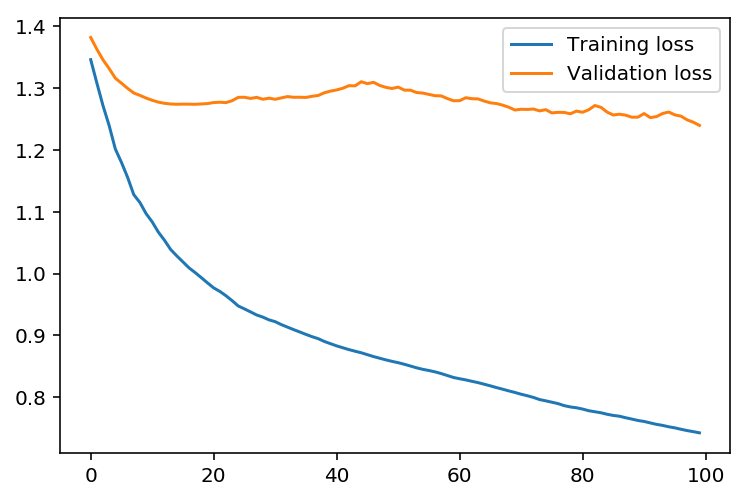

In [168]:
plt.plot(losses['train'], label='Training loss')
plt.plot(losses['validation'], label='Validation loss')
plt.legend()
_ = plt.ylim()

## Check out your predictions

Here, use the test data to view how well your network is modeling the data. If something is completely wrong here, make sure each step in your network is implemented correctly.

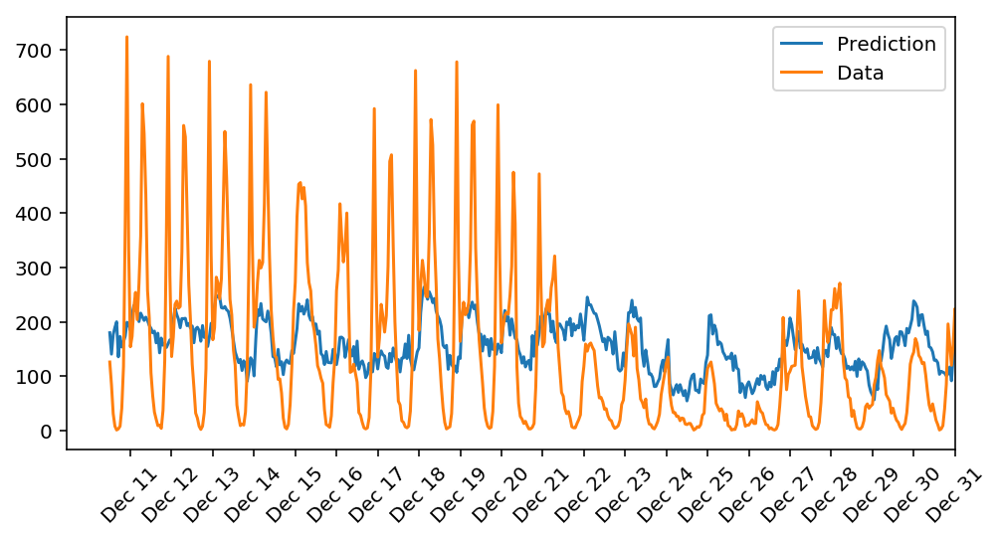

In [178]:
fig, ax = plt.subplots(figsize=(8,4))

mean, std = scaled_features['cnt']
predictions = network.run(test_features).T*std + mean
ax.plot(predictions[0], label='Prediction')
ax.plot((test_targets['cnt']*std + mean).values, label='Data')
ax.set_xlim(right=len(predictions))
ax.legend()

dates = pd.to_datetime(rides.ix[test_data.index]['dteday'])
dates = dates.apply(lambda d: d.strftime('%b %d'))
ax.set_xticks(np.arange(len(dates))[12::24])
_ = ax.set_xticklabels(dates[12::24], rotation=45)

## OPTIONAL: Thinking about your results(this question will not be evaluated in the rubric).
 
Answer these questions about your results. How well does the model predict the data? Where does it fail? Why does it fail where it does?

> **Note:** You can edit the text in this cell by double clicking on it. When you want to render the text, press control + enter

#### Your answer below